# LSTM 전력 수요 예측 

### 목차

In [1]:
"""
1. 모듈 임포트

2. 데이터 합본 저장
    -3년치 데이터
    -4년치 데이터

3. 그래프 확인
    -각 연도별 csv 데이터 로드
    -plt 그래프 함수
    -2013
    -2014
    -2015
    -2013-2015

4. 데이터 정규화 
    -Min-Max Scaling 이용, 4년치 학습 데이터 정규화

5. 데이터 연관성 분석

6. 이상치 처리
    -이상치 확인 함수 생성
    -분위별 이상치 1차 검색
    -이상치 치환
    -처리 후 잔여 개수 확인

7. 데이터셋 편집

8. 딥러닝 모델

9. 결과 표시
    -그래프 표시
    -그래프 비교 결과
    -성능 측정 지표

10. 예측값과 실제값 결과 csv 파일 저장
    -1년 단위 저장
    -1달 단위 저장
    -일주일 단위 저장
"""

'\n1. 모듈 임포트\n\n2. 데이터 합본 저장\n    -3년치 데이터\n    -4년치 데이터\n\n3. 그래프 확인\n    -각 연도별 csv 데이터 로드\n    -plt 그래프 함수\n    -2013\n    -2014\n    -2015\n    -2013-2015\n\n4. 데이터 정규화 \n    -Min-Max Scaling 이용, 4년치 학습 데이터 정규화\n\n5. 데이터 연관성 분석\n\n6. 이상치 처리\n    -이상치 확인 함수 생성\n    -분위별 이상치 1차 검색\n    -이상치 치환\n    -처리 후 잔여 개수 확인\n\n7. 데이터셋 편집\n\n8. 딥러닝 모델\n\n9. 결과 표시\n    -그래프 표시\n    -그래프 비교 결과\n    -성능 측정 지표\n\n10. 예측값과 실제값 결과 csv 파일 저장\n    -1년 단위 저장\n    -1달 단위 저장\n    -일주일 단위 저장\n'

### <화면 가로 확장>

In [1]:
# 화면 가로 확장 코드 (기본 width 50%)
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

### 1. 모듈 임포트

In [2]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import tensorflow as tf
import csv
import os
import datetime

### <GPU 확인>

In [3]:
tf.test.gpu_device_name()

'/device:GPU:0'

### 2. 데이터 합본 저장

#### 3년치 데이터

In [4]:
df_3Y = pd.DataFrame()
for y in range(2013, 2016):
    file = './Combined_Data/'+str(y)+'_'+'House1_Ch1_Combined_Data_Y.csv'
    df_y= pd.read_csv(file, encoding='cp949')
    df_3Y = pd.concat([df_3Y, df_y])
    
df_3Y = df_3Y.drop([df_3Y.columns[0]], axis=1)
df_3Y = df_3Y.reset_index(drop=True)
df_3Y.to_csv("./Combined_Data/House1_Ch1_Combined_Data_13-15.csv", encoding='cp949')

In [5]:
Data_3Y = pd.read_csv('./Combined_Data/House1_Ch1_Combined_Data_13-15.csv', encoding='cp949')
Data_3Y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26280 entries, 0 to 26279
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  26280 non-null  int64  
 1   DateTime    26280 non-null  int64  
 2   Graph_Date  26280 non-null  object 
 3   Day         26280 non-null  object 
 4   Holiday     26280 non-null  int64  
 5   Seq         26280 non-null  int64  
 6   Watt        26280 non-null  int64  
 7   Temp        26280 non-null  float64
 8   CPI         26280 non-null  float64
dtypes: float64(2), int64(5), object(2)
memory usage: 1.8+ MB


#### 4년치 데이터

In [6]:
df_4Y = pd.DataFrame()
for y in range(2013, 2017):
    file = './Combined_Data/'+str(y)+'_'+'House1_Ch1_Combined_Data_Y.csv'
    df_y= pd.read_csv(file, encoding='cp949')
    df_4Y = pd.concat([df_4Y, df_y])
    
df_4Y = df_4Y.drop([df_4Y.columns[0]], axis=1)
df_4Y = df_4Y.reset_index(drop=True)
df_4Y.to_csv("./Combined_Data/House1_Ch1_Combined_Data_13-16.csv", encoding='cp949')

In [7]:
Data_4Y = pd.read_csv('./Combined_Data/House1_Ch1_Combined_Data_13-16.csv', encoding='cp949')
Data_4Y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35040 entries, 0 to 35039
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  35040 non-null  int64  
 1   DateTime    35040 non-null  int64  
 2   Graph_Date  35040 non-null  object 
 3   Day         35040 non-null  object 
 4   Holiday     35040 non-null  int64  
 5   Seq         35040 non-null  int64  
 6   Watt        35040 non-null  int64  
 7   Temp        35040 non-null  float64
 8   CPI         35040 non-null  float64
dtypes: float64(2), int64(5), object(2)
memory usage: 2.4+ MB


### 3. 그래프 확인

#### 각 연도별 csv 데이터 로드

In [8]:
Data_2013=pd.read_csv('./Combined_Data/2013_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2014=pd.read_csv('./Combined_Data/2014_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2015=pd.read_csv('./Combined_Data/2015_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2016=pd.read_csv('./Combined_Data/2016_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')

#### Plt 그래프 함수

In [9]:
def Graph(name1, name2, year):
    font_head = {'color': 'w', 'weight': 'bold', 'size': 20}
    font_body = {'color': 'w', 'weight': 'bold', 'size': 15}

    # 1번째 그래프
    ax1 = plt.subplot(2, 1, 1)
    ax1.spines['left'].set_color('yellow')
    ax1.spines['left'].set_lw(2)
    ax1.spines['bottom'].set_color('yellow')
    ax1.spines['bottom'].set_lw(2)

    ax1.tick_params(axis='x', colors='white', size=10)
    ax1.tick_params(axis='x', colors='white', labelsize=15)
    ax1.tick_params(axis='y', colors='white', size=10)
    ax1.tick_params(axis='y', colors='white', labelsize=15)

    plt.plot(x, y1, '.-', color='y', linewidth=1)
    plt.title(name1, fontdict=font_head, pad=20)
    plt.xticks(visible=False)
    plt.ylabel('Watt',labelpad=15, fontdict=font_body)

    # 2번째 그래프
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    ax2.spines['left'].set_color('blue')
    ax2.spines['left'].set_lw(2)
    ax2.spines['bottom'].set_color('blue')
    ax2.spines['bottom'].set_lw(2)

    ax2.tick_params(axis='x', colors='white', size=10)
    ax2.tick_params(axis='x', colors='white', labelsize=15)
    ax2.tick_params(axis='y', colors='white', size=10)
    ax2.tick_params(axis='y', colors='white', labelsize=15)

    plt.plot(x, y2, '.-', color='b', linewidth=1)
    plt.title(name2, fontdict=font_head, pad=20)
    plt.xlabel('Time',labelpad=15, fontdict=font_body)
    plt.ylabel('Temp',labelpad=15, fontdict=font_body)
    plt.margins(x=0.02)
    
    if year==1:
        plt.xticks([0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334], labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    if year==3:
        plt.xticks([0, 365, 730], labels=['2013', '2014', '2015'])

    #plt.tight_layout()
    plt.show()

#### 1년치 그래프 확인

#### 2013

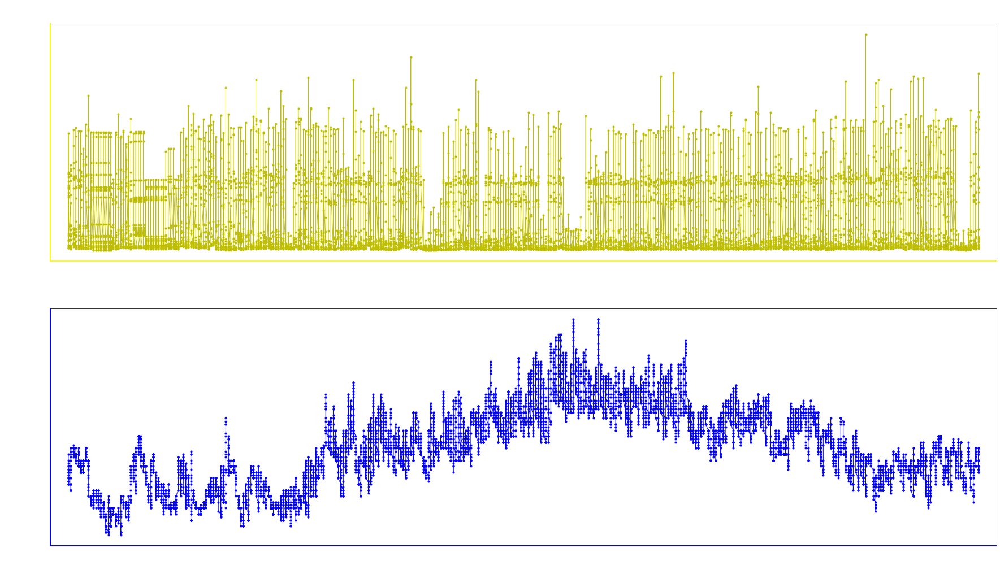

In [29]:
x = Data_2013['Graph_Date']
y1 = Data_2013['Watt']
y2 = Data_2013['Temp']

plt.figure(figsize=(30,17))

Graph("2013's Time-Watt Graph", "2013's Time-Temp Graph", 1)

#### 2014

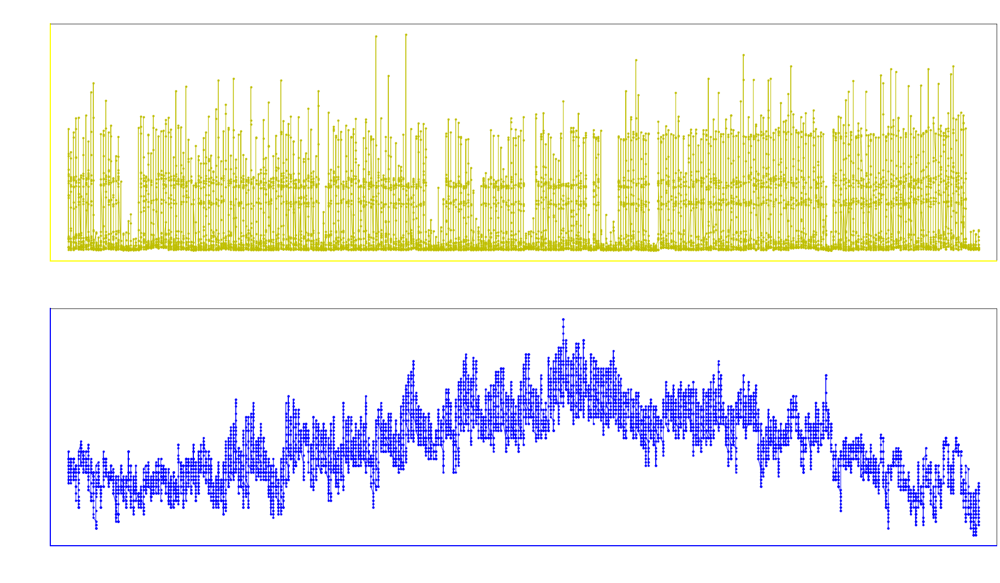

In [30]:
x = Data_2014['Graph_Date']
y1 = Data_2014['Watt']
y2 = Data_2014['Temp']

plt.figure(figsize=(30,17))

Graph("2014's Time-Watt Graph", "2014's Time-Temp Graph", 1)

#### 2015

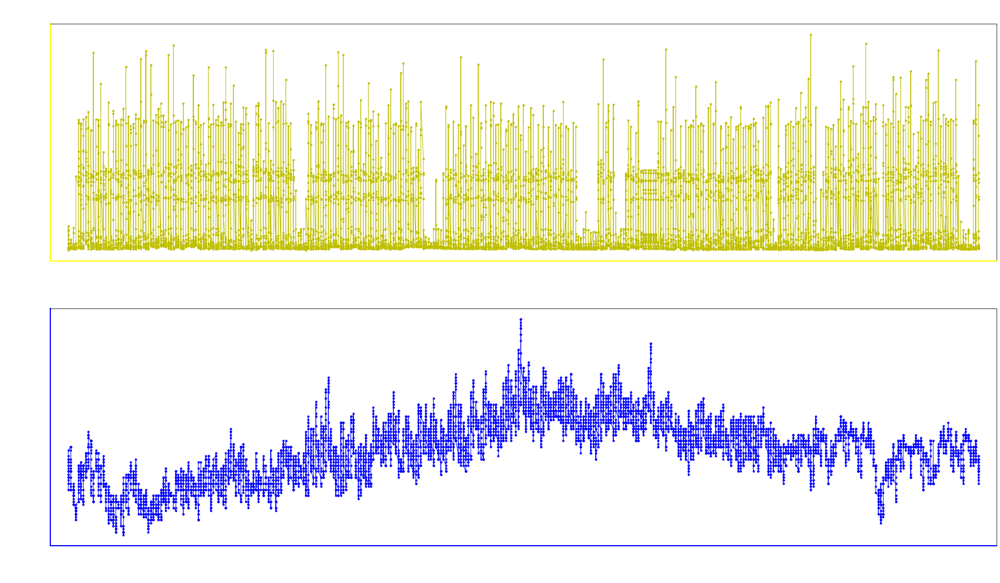

In [31]:
x = Data_2015['Graph_Date']
y1 = Data_2015['Watt']
y2 = Data_2015['Temp']

plt.figure(figsize=(30,17))

Graph("2015's Time-Watt Graph", "2015's Time-Temp Graph", 1)

#### 3년치 데이터 그래프 확인

#### 2013-2015

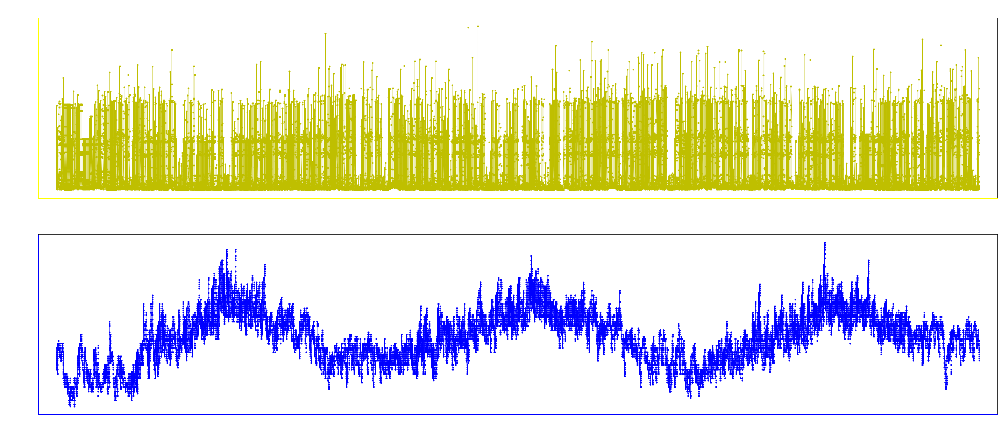

In [32]:
x = Data_3Y['Graph_Date']
y1 = Data_3Y['Watt']
y2 = Data_3Y['Temp']

plt.figure(figsize=(40,17))

Graph("13-15's Time-Watt Graph","13-15's Time-Temp Graph", 3)

### 4. 데이터 정규화

#### Min-Max Scaling 이용, 4년치 학습 데이터 정규화

In [10]:
from sklearn.preprocessing import MinMaxScaler

# 정규화 과정을 거쳐 데이터 범위를 원하는 범위로 제한. 그래프는 동일하나 손실 정도를 확인하기에 더 좋음.
#배치 정규화는 기울기 소멸 문제를 해결하기는 좋으나, RNN의 경우 계층별로 미니 정규화 적용이 필요해 모델이 복잡해지고 효율이 저하됨.
Data_4Y.sort_index(ascending=False).reset_index(drop=True)

scaler = MinMaxScaler()
scale_cols = ['Holiday', 'Watt', 'Temp', 'CPI']
Data_4Y_scaled = scaler.fit_transform(Data_4Y[scale_cols])
Data_4Y_scaled = pd.DataFrame(Data_4Y_scaled)
Data_4Y_scaled.columns = scale_cols

Data_4Y_scaled.insert(0, 'DateTime', Data_4Y['DateTime'])
Data_4Y_scaled.insert(1, 'Graph_Date', Data_4Y['Graph_Date'])
Data_4Y_scaled

,DateTime,Graph_Date,Holiday,Watt,Temp,CPI
0,20130101,2013-01-01,1.0,0.270038,0.360000,0.933333
1,20130101,2013-01-01,1.0,0.268530,0.333333,0.933333
2,20130101,2013-01-01,1.0,0.263775,0.320000,0.933333
3,20130101,2013-01-01,1.0,0.011368,0.306667,0.933333
4,20130101,2013-01-01,1.0,0.010788,0.306667,0.933333
...,...,...,...,...,...,...
35035,20161231,2016-12-31,1.0,0.024707,0.333333,0.566667
35036,20161231,2016-12-31,1.0,0.182809,0.333333,0.566667
35037,20161231,2016-12-31,1.0,0.089781,0.306667,0.566667
35038,20161231,2016-12-31,1.0,0.049878,0.306667,0.566667


### 5. 데이터 연관성 분석

In [11]:
import scipy.stats as stats

# 피어슨 stat을 이용하면 피어슨 상관계수와 p-value값이 출력되는데 상관계수는 양 or 음의 비례관계 정도를, p-value는 상관 정도를 보여준다. (0에 가까울수록 영향이 크다.)

Correlation=stats.pearsonr(Data_4Y_scaled['Holiday'], Data_4Y_scaled['Watt'])
print('< Holiday - Watt >')
print('P-value ==>> %.3f\n' %Correlation[1])

Correlation=stats.pearsonr(Data_4Y_scaled['Temp'], Data_4Y_scaled['Watt'])
print('< Temp - Watt >')
print('P-value ==>> %.3f\n' %Correlation[1])

Correlation=stats.pearsonr(Data_4Y_scaled['CPI'], Data_4Y_scaled['Watt'])
print('< CPI - Watt >')
print('P-value ==>> %.3f\n' %Correlation[1])

< Holiday - Watt >
P-value ==>> 0.000

< Temp - Watt >
P-value ==>> 0.169

< CPI - Watt >
P-value ==>> 0.000



### 6. 이상치 처리

#### 이상치 확인 함수 생성

In [12]:
def get_outlier(df=None, column=None, weight=1.5):
    quantile_25 = np.percentile(df[column].values, 25)
    quantile_50 = np.percentile(df[column].values, 50)
    quantile_75 = np.percentile(df[column].values, 75)
    
    IQR = quantile_75 - quantile_25
    IQR_weight = IQR * weight
    
    lowest_val = quantile_25-IQR_weight
    highest_val = quantile_75+IQR_weight
    
    outlier_index_low = df[column][df[column] < lowest_val].index
    outlier_index_high = df[column][df[column] > highest_val].index
    
    return outlier_index_low, outlier_index_high, quantile_25, quantile_50, quantile_75

#### 분위별 이상치 1차 검색

In [13]:
print('Low Outlier ==>> {}\n'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[0]))
print('High Outlier ==>> {}\n'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[1]))

print('25% Value ==>> {}\n'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[2]))
print('50% Value ==>> {}\n'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[3]))
print('75% Value ==>> {}'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[4]))

Low Outlier ==>> Int64Index([], dtype='int64')

High Outlier ==>> Int64Index([  199,  1159,  1519,  1813,  1938,  2057,  2084,  2225,  2321,
             2341,
            ...
            33225, 33537, 33761, 34063, 34193, 34309, 34429, 34906, 34907,
            35025],
           dtype='int64', length=230)

25% Value ==>> 0.014499478018791326

50% Value ==>> 0.03932258438696207

75% Value ==>> 0.24834705950585778


#### 이상치 치환

In [14]:
high_val = get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[1].values.tolist()

for l in range(len(high_val)):
    Data_4Y_scaled['Watt'][high_val[l]] = get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[4]

C:\Users\82108\AppData\Local\Temp/ipykernel_3876/1588975600.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Data_4Y_scaled['Watt'][high_val[l]] = get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[4]


#### 이상치 처리 후 잔여 개수 확인

In [15]:
print('Quantity of Low Outlier ==>> {}\n'.format(len(get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[0])))
print('Quantity of High Outlier ==>> {}\n'.format(len(get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[1])))

Quantity of Low Outlier ==>> 0

Quantity of High Outlier ==>> 0



### 7. 데이터셋 편집

In [16]:
TEST_SIZE = 8761 # 1년치를 테스트셋으로 사용
WINDOW_SIZE = 1 # 얼마 동안의 과거 기반의 데이터에 기반하여 다음날의 값을 예측할 것인지 설정. 1=1시간을 의미

train = Data_4Y_scaled[:-TEST_SIZE]
test= Data_4Y_scaled[-TEST_SIZE:]

In [17]:
def make_dataset(data, label, window_size=1):
    feature_list = []
    label_list = []
    for i in range(len(data) - window_size):
        feature_list.append(np.array(data.iloc[i:i+window_size]))
        label_list.append(np.array(label.iloc[i+window_size]))
    return np.array(feature_list), np.array(label_list)

In [18]:
from sklearn.model_selection import train_test_split

feature_cols = ['Holiday', 'Watt', 'Temp', 'CPI']
label_cols = ['Watt']

train_feature = train[feature_cols]
train_label = train[label_cols]

train_feature, train_label = make_dataset(train_feature, train_label, 1)# 여기서도 일자 설정

x_train, x_valid, y_train, y_valid = train_test_split(train_feature, train_label, test_size=0.2, shuffle=False)

In [19]:
print(' x_train >> {0}\n x_valid >> {1}\n y_train >> {2}\n y_valid >> {3}'.format(x_train.shape, x_valid.shape, y_train.shape, y_valid.shape))

 x_train >> (21022, 1, 4)
 x_valid >> (5256, 1, 4)
 y_train >> (21022, 1)
 y_valid >> (5256, 1)


In [20]:
x_test = test[feature_cols]
y_test = test[label_cols]

In [21]:
x_test, y_test = make_dataset(x_test, y_test, 1)
x_test.shape, y_test.shape

((8760, 1, 4), (8760, 1))

### 8. 딥러닝 모델

In [22]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Bidirectional
from keras.layers import TimeDistributed
import keras

tf.debugging.set_log_device_placement(True)

with tf.device('/GPU:0'):
    model = Sequential()
    model.add(LSTM(256, activation='ReLU', input_shape=(train_feature.shape[1], train_feature.shape[2]), return_sequences=True))
    model.add(Bidirectional(LSTM(128, activation='ReLU', return_sequences=True), merge_mode='concat'))
    model.add(LSTM(128, activation='ReLU', return_sequences = True))
    model.add(Bidirectional(LSTM(64, activation='ReLU', return_sequences=True), merge_mode='concat'))
    model.add(LSTM(64, activation='ReLU', return_sequences = True))
    model.add(Bidirectional(LSTM(32, activation='ReLU', return_sequences=True), merge_mode='concat'))
    model.add(TimeDistributed(Dense(32)))
    model.add(LSTM(32, activation='ReLU', return_sequences = False))
    model.add(Dense(1, activation = 'sigmoid'))
    model.summary()

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job

Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ConcatV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/ta

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ConcatV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ConcatV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/devic

In [28]:
import os

# 시간 표시, 측정용
now = datetime.datetime.now() # 현재 시각
TimeNow = now.strftime('%Y-%m-%d  %H:%M:%S') # 시작 시각 표시용.
Nadam = tf.keras.optimizers.Nadam(lr=0.001)

with tf.device('/GPU:0'):
    print('Start Time >>', TimeNow, '\n')
    now = datetime.datetime.now()
    start = now

    model.compile(loss='mean_squared_error', optimizer='Nadam', metrics=['mse'])
    early_stop = EarlyStopping(monitor='val_loss', patience=7)

    model_path = 'model'
    filename = os.path.join(model_path, 'tmp_checkpoint.h5')
    checkpoint = ModelCheckpoint(filename, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
    history = model.fit(x_train, y_train, epochs=35, batch_size=32,validation_data=(x_valid, y_valid), callbacks=[early_stop, checkpoint])

    now = datetime.datetime.now()
    end = now
    elapsed_time = end-start
    elapsed_time = str(elapsed_time).split(".")
    elapsed_time = elapsed_time[0]
    print('소요시간 >> ', elapsed_time)

Start Time >> 2022-02-25  01:04:39 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localh

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/rep

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/rep

Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 18/657 [..............................] - ETA: 40s - loss: 0.1490 - mse: 0.1490Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 19/657 [..............................] - ETA: 40s - loss: 0.1506 - mse: 0.1506Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 20/657 [..............................] - ETA: 40s - loss: 0.1496 - mse: 0.1496Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica

 42/657 [>.............................] - ETA: 38s - loss: 0.1277 - mse: 0.1277Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 43/657 [>.............................] - ETA: 38s - loss: 0.1251 - mse: 0.1251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 44/657 [=>............................] - ETA: 38s - loss: 0.1227 - mse: 0.1227Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 66/657 [==>...........................] - ETA: 37s - loss: 0.0907 - mse: 0.0907Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 67/657 [==>...........................] - ETA: 37s - loss: 0.0897 - mse: 0.0897Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 68/657 [==>...........................] - ETA: 37s - loss: 0.0887 - mse: 0.0887Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 90/657 [===>..........................] - ETA: 36s - loss: 0.0722 - mse: 0.0722Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 91/657 [===>..........................] - ETA: 36s - loss: 0.0717 - mse: 0.0717Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 92/657 [===>..........................] - ETA: 36s - loss: 0.0713 - mse: 0.0713Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

114/657 [====>.........................] - ETA: 35s - loss: 0.0615 - mse: 0.0615Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
115/657 [====>.........................] - ETA: 35s - loss: 0.0612 - mse: 0.0612Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
116/657 [====>.........................] - ETA: 35s - loss: 0.0608 - mse: 0.0608Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

138/657 [=====>........................] - ETA: 33s - loss: 0.0549 - mse: 0.0549Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
139/657 [=====>........................] - ETA: 33s - loss: 0.0546 - mse: 0.0546Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
140/657 [=====>........................] - ETA: 33s - loss: 0.0544 - mse: 0.0544Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

162/657 [======>.......................] - ETA: 32s - loss: 0.0498 - mse: 0.0498Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
163/657 [======>.......................] - ETA: 32s - loss: 0.0496 - mse: 0.0496Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
164/657 [======>.......................] - ETA: 32s - loss: 0.0494 - mse: 0.0494Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

186/657 [=======>......................] - ETA: 30s - loss: 0.0460 - mse: 0.0460Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
187/657 [=======>......................] - ETA: 30s - loss: 0.0458 - mse: 0.0458Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
188/657 [=======>......................] - ETA: 30s - loss: 0.0457 - mse: 0.0457Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

210/657 [========>.....................] - ETA: 29s - loss: 0.0430 - mse: 0.0430Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
211/657 [========>.....................] - ETA: 29s - loss: 0.0429 - mse: 0.0429Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
212/657 [========>.....................] - ETA: 29s - loss: 0.0428 - mse: 0.0428Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

234/657 [=========>....................] - ETA: 27s - loss: 0.0408 - mse: 0.0408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
235/657 [=========>....................] - ETA: 27s - loss: 0.0407 - mse: 0.0407Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
236/657 [=========>....................] - ETA: 27s - loss: 0.0406 - mse: 0.0406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

258/657 [==========>...................] - ETA: 26s - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
259/657 [==========>...................] - ETA: 26s - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
260/657 [==========>...................] - ETA: 26s - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

282/657 [===========>..................] - ETA: 24s - loss: 0.0369 - mse: 0.0369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
283/657 [===========>..................] - ETA: 24s - loss: 0.0368 - mse: 0.0368Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
284/657 [===========>..................] - ETA: 24s - loss: 0.0367 - mse: 0.0367Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

306/657 [============>.................] - ETA: 23s - loss: 0.0355 - mse: 0.0355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
307/657 [=============>................] - ETA: 23s - loss: 0.0355 - mse: 0.0355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
308/657 [=============>................] - ETA: 23s - loss: 0.0354 - mse: 0.0354Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

330/657 [==============>...............] - ETA: 21s - loss: 0.0343 - mse: 0.0343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
331/657 [==============>...............] - ETA: 21s - loss: 0.0343 - mse: 0.0343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
332/657 [==============>...............] - ETA: 21s - loss: 0.0343 - mse: 0.0343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

354/657 [===============>..............] - ETA: 19s - loss: 0.0331 - mse: 0.0331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
355/657 [===============>..............] - ETA: 19s - loss: 0.0331 - mse: 0.0331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
356/657 [===============>..............] - ETA: 19s - loss: 0.0330 - mse: 0.0330Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

378/657 [================>.............] - ETA: 18s - loss: 0.0322 - mse: 0.0322Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
379/657 [================>.............] - ETA: 18s - loss: 0.0322 - mse: 0.0322Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
380/657 [================>.............] - ETA: 18s - loss: 0.0322 - mse: 0.0322Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

402/657 [=================>............] - ETA: 16s - loss: 0.0315 - mse: 0.0315Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
403/657 [=================>............] - ETA: 16s - loss: 0.0315 - mse: 0.0315Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
404/657 [=================>............] - ETA: 16s - loss: 0.0314 - mse: 0.0314Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

426/657 [==================>...........] - ETA: 15s - loss: 0.0307 - mse: 0.0307Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
427/657 [==================>...........] - ETA: 15s - loss: 0.0307 - mse: 0.0307Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
428/657 [==================>...........] - ETA: 15s - loss: 0.0307 - mse: 0.0307Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

450/657 [===================>..........] - ETA: 13s - loss: 0.0301 - mse: 0.0301Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
451/657 [===================>..........] - ETA: 13s - loss: 0.0301 - mse: 0.0301Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
452/657 [===================>..........] - ETA: 13s - loss: 0.0300 - mse: 0.0300Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

474/657 [====================>.........] - ETA: 12s - loss: 0.0294 - mse: 0.0294Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
475/657 [====================>.........] - ETA: 12s - loss: 0.0294 - mse: 0.0294Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
476/657 [====================>.........] - ETA: 11s - loss: 0.0294 - mse: 0.0294Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

498/657 [=====================>........] - ETA: 10s - loss: 0.0290 - mse: 0.0290Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
499/657 [=====================>........] - ETA: 10s - loss: 0.0289 - mse: 0.0289Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
500/657 [=====================>........] - ETA: 10s - loss: 0.0289 - mse: 0.0289Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

522/657 [======================>.......] - ETA: 8s - loss: 0.0285 - mse: 0.0285Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
523/657 [======================>.......] - ETA: 8s - loss: 0.0284 - mse: 0.0284Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
524/657 [======================>.......] - ETA: 8s - loss: 0.0284 - mse: 0.0284Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

546/657 [=======================>......] - ETA: 7s - loss: 0.0280 - mse: 0.0280Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
547/657 [=======================>......] - ETA: 7s - loss: 0.0280 - mse: 0.0280Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
548/657 [========================>.....] - ETA: 7s - loss: 0.0280 - mse: 0.0280Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

570/657 [=========================>....] - ETA: 5s - loss: 0.0276 - mse: 0.0276Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
571/657 [=========================>....] - ETA: 5s - loss: 0.0275 - mse: 0.0275Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
572/657 [=========================>....] - ETA: 5s - loss: 0.0275 - mse: 0.0275Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

594/657 [==========================>...] - ETA: 4s - loss: 0.0272 - mse: 0.0272Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
595/657 [==========================>...] - ETA: 4s - loss: 0.0272 - mse: 0.0272Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
596/657 [==========================>...] - ETA: 4s - loss: 0.0272 - mse: 0.0272Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

618/657 [===========================>..] - ETA: 2s - loss: 0.0268 - mse: 0.0268Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
619/657 [===========================>..] - ETA: 2s - loss: 0.0268 - mse: 0.0268Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
620/657 [===========================>..] - ETA: 2s - loss: 0.0268 - mse: 0.0268Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

642/657 [============================>.] - ETA: 0s - loss: 0.0265 - mse: 0.0265Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
643/657 [============================>.] - ETA: 0s - loss: 0.0265 - mse: 0.0265Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
644/657 [============================>.] - ETA: 0s - loss: 0.0265 - mse: 0.0265Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 16/657 [..............................] - ETA: 44s - loss: 0.0213 - mse: 0.0213Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 17/657 [..............................] - ETA: 44s - loss: 0.0212 - mse: 0.0212Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 18/657 [..............................] - ETA: 44s - loss: 0.0210 - mse: 0.0210Executing op ReadVariableOp in device /job:localhost/replica

Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 40/657 [>.............................] - ETA: 42s - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 41/657 [>.............................] - ETA: 42s - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 42/657 [>.............................] - ETA: 42s - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica

 64/657 [=>............................] - ETA: 41s - loss: 0.0195 - mse: 0.0195Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 65/657 [=>............................] - ETA: 41s - loss: 0.0194 - mse: 0.0194Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 66/657 [==>...........................] - ETA: 41s - loss: 0.0194 - mse: 0.0194Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 88/657 [===>..........................] - ETA: 40s - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 89/657 [===>..........................] - ETA: 40s - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 90/657 [===>..........................] - ETA: 40s - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

112/657 [====>.........................] - ETA: 38s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
113/657 [====>.........................] - ETA: 38s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
114/657 [====>.........................] - ETA: 38s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

136/657 [=====>........................] - ETA: 36s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
137/657 [=====>........................] - ETA: 36s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
138/657 [=====>........................] - ETA: 36s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

160/657 [======>.......................] - ETA: 35s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
161/657 [======>.......................] - ETA: 35s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
162/657 [======>.......................] - ETA: 34s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

184/657 [=======>......................] - ETA: 33s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
185/657 [=======>......................] - ETA: 33s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
186/657 [=======>......................] - ETA: 33s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

208/657 [========>.....................] - ETA: 31s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
209/657 [========>.....................] - ETA: 31s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
210/657 [========>.....................] - ETA: 31s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

232/657 [=========>....................] - ETA: 29s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
233/657 [=========>....................] - ETA: 29s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
234/657 [=========>....................] - ETA: 29s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

256/657 [==========>...................] - ETA: 28s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
257/657 [==========>...................] - ETA: 28s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
258/657 [==========>...................] - ETA: 28s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

280/657 [===========>..................] - ETA: 26s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
281/657 [===========>..................] - ETA: 26s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
282/657 [===========>..................] - ETA: 26s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

304/657 [============>.................] - ETA: 24s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
305/657 [============>.................] - ETA: 24s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
306/657 [============>.................] - ETA: 24s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

328/657 [=============>................] - ETA: 23s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
329/657 [==============>...............] - ETA: 23s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
330/657 [==============>...............] - ETA: 22s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

352/657 [===============>..............] - ETA: 21s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
353/657 [===============>..............] - ETA: 21s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
354/657 [===============>..............] - ETA: 21s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

376/657 [================>.............] - ETA: 19s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
377/657 [================>.............] - ETA: 19s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
378/657 [================>.............] - ETA: 19s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

400/657 [=================>............] - ETA: 17s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
401/657 [=================>............] - ETA: 17s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
402/657 [=================>............] - ETA: 17s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

424/657 [==================>...........] - ETA: 16s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
425/657 [==================>...........] - ETA: 16s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
426/657 [==================>...........] - ETA: 15s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

448/657 [===================>..........] - ETA: 14s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
449/657 [===================>..........] - ETA: 14s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
450/657 [===================>..........] - ETA: 14s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

472/657 [====================>.........] - ETA: 12s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
473/657 [====================>.........] - ETA: 12s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
474/657 [====================>.........] - ETA: 12s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

496/657 [=====================>........] - ETA: 11s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
497/657 [=====================>........] - ETA: 11s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
498/657 [=====================>........] - ETA: 11s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

520/657 [======================>.......] - ETA: 9s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
521/657 [======================>.......] - ETA: 9s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
522/657 [======================>.......] - ETA: 9s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

544/657 [=======================>......] - ETA: 7s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
545/657 [=======================>......] - ETA: 7s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
546/657 [=======================>......] - ETA: 7s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

568/657 [========================>.....] - ETA: 6s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
569/657 [========================>.....] - ETA: 6s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
570/657 [=========================>....] - ETA: 6s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

592/657 [==========================>...] - ETA: 4s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
593/657 [==========================>...] - ETA: 4s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
594/657 [==========================>...] - ETA: 4s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

616/657 [===========================>..] - ETA: 2s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
617/657 [===========================>..] - ETA: 2s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
618/657 [===========================>..] - ETA: 2s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

640/657 [============================>.] - ETA: 1s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
641/657 [============================>.] - ETA: 1s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
642/657 [============================>.] - ETA: 1s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0

Epoch 00002: val_loss improved from 0.02102 to 0.01944, saving model to model\tmp_checkpoint.h5
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

 18/657 [..............................] - ETA: 45s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 19/657 [..............................] - ETA: 44s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 20/657 [..............................] - ETA: 44s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 42/657 [>.............................] - ETA: 41s - loss: 0.0175 - mse: 0.0175Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 43/657 [>.............................] - ETA: 41s - loss: 0.0173 - mse: 0.0173Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 44/657 [=>............................] - ETA: 41s - loss: 0.0172 - mse: 0.0172Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 66/657 [==>...........................] - ETA: 39s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 67/657 [==>...........................] - ETA: 39s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 68/657 [==>...........................] - ETA: 39s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 90/657 [===>..........................] - ETA: 37s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 91/657 [===>..........................] - ETA: 37s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 92/657 [===>..........................] - ETA: 37s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

114/657 [====>.........................] - ETA: 36s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
115/657 [====>.........................] - ETA: 36s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
116/657 [====>.........................] - ETA: 36s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

138/657 [=====>........................] - ETA: 34s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
139/657 [=====>........................] - ETA: 34s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
140/657 [=====>........................] - ETA: 34s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

162/657 [======>.......................] - ETA: 33s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
163/657 [======>.......................] - ETA: 33s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
164/657 [======>.......................] - ETA: 33s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

186/657 [=======>......................] - ETA: 31s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
187/657 [=======>......................] - ETA: 31s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
188/657 [=======>......................] - ETA: 31s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

210/657 [========>.....................] - ETA: 30s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
211/657 [========>.....................] - ETA: 30s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
212/657 [========>.....................] - ETA: 30s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

234/657 [=========>....................] - ETA: 28s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
235/657 [=========>....................] - ETA: 28s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
236/657 [=========>....................] - ETA: 28s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

258/657 [==========>...................] - ETA: 26s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
259/657 [==========>...................] - ETA: 26s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
260/657 [==========>...................] - ETA: 26s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

282/657 [===========>..................] - ETA: 25s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
283/657 [===========>..................] - ETA: 24s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
284/657 [===========>..................] - ETA: 24s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

306/657 [============>.................] - ETA: 23s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
307/657 [=============>................] - ETA: 23s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
308/657 [=============>................] - ETA: 23s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

330/657 [==============>...............] - ETA: 21s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
331/657 [==============>...............] - ETA: 21s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
332/657 [==============>...............] - ETA: 21s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

354/657 [===============>..............] - ETA: 20s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
355/657 [===============>..............] - ETA: 20s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
356/657 [===============>..............] - ETA: 19s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

378/657 [================>.............] - ETA: 18s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
379/657 [================>.............] - ETA: 18s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
380/657 [================>.............] - ETA: 18s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

402/657 [=================>............] - ETA: 16s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
403/657 [=================>............] - ETA: 16s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
404/657 [=================>............] - ETA: 16s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

426/657 [==================>...........] - ETA: 15s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
427/657 [==================>...........] - ETA: 15s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
428/657 [==================>...........] - ETA: 15s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

450/657 [===================>..........] - ETA: 13s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
451/657 [===================>..........] - ETA: 13s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
452/657 [===================>..........] - ETA: 13s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

474/657 [====================>.........] - ETA: 12s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
475/657 [====================>.........] - ETA: 12s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
476/657 [====================>.........] - ETA: 12s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

498/657 [=====================>........] - ETA: 10s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
499/657 [=====================>........] - ETA: 10s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
500/657 [=====================>........] - ETA: 10s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

522/657 [======================>.......] - ETA: 8s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
523/657 [======================>.......] - ETA: 8s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
524/657 [======================>.......] - ETA: 8s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

546/657 [=======================>......] - ETA: 7s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
547/657 [=======================>......] - ETA: 7s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
548/657 [========================>.....] - ETA: 7s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

570/657 [=========================>....] - ETA: 5s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
571/657 [=========================>....] - ETA: 5s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
572/657 [=========================>....] - ETA: 5s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

594/657 [==========================>...] - ETA: 4s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
595/657 [==========================>...] - ETA: 4s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
596/657 [==========================>...] - ETA: 4s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

618/657 [===========================>..] - ETA: 2s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
619/657 [===========================>..] - ETA: 2s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
620/657 [===========================>..] - ETA: 2s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

642/657 [============================>.] - ETA: 0s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
643/657 [============================>.] - ETA: 0s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
644/657 [============================>.] - ETA: 0s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:


Epoch 00003: val_loss improved from 0.01944 to 0.01890, saving model to model\tmp_checkpoint.h5
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identit

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
657/657 [==============================] - 45s 68ms/step - loss: 0.0187 - mse: 0.0187 - val_loss: 0.0189 - val_mse: 0.0189
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

 20/657 [..............................] - ETA: 40s - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 21/657 [..............................] - ETA: 40s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/657 [>.............................] - ETA: 40s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 44/657 [=>............................] - ETA: 39s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 45/657 [=>............................] - ETA: 39s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 46/657 [=>............................] - ETA: 39s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 68/657 [==>...........................] - ETA: 37s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 69/657 [==>...........................] - ETA: 37s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 70/657 [==>...........................] - ETA: 37s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 92/657 [===>..........................] - ETA: 36s - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 93/657 [===>..........................] - ETA: 36s - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 94/657 [===>..........................] - ETA: 36s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

116/657 [====>.........................] - ETA: 34s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
117/657 [====>.........................] - ETA: 34s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
118/657 [====>.........................] - ETA: 34s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

140/657 [=====>........................] - ETA: 33s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
141/657 [=====>........................] - ETA: 33s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
142/657 [=====>........................] - ETA: 33s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

164/657 [======>.......................] - ETA: 31s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
165/657 [======>.......................] - ETA: 31s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
166/657 [======>.......................] - ETA: 31s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

188/657 [=======>......................] - ETA: 30s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
189/657 [=======>......................] - ETA: 30s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
190/657 [=======>......................] - ETA: 30s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

212/657 [========>.....................] - ETA: 28s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
213/657 [========>.....................] - ETA: 28s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
214/657 [========>.....................] - ETA: 28s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

236/657 [=========>....................] - ETA: 27s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
237/657 [=========>....................] - ETA: 27s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
238/657 [=========>....................] - ETA: 27s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

260/657 [==========>...................] - ETA: 25s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
261/657 [==========>...................] - ETA: 25s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
262/657 [==========>...................] - ETA: 25s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

284/657 [===========>..................] - ETA: 24s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
285/657 [============>.................] - ETA: 24s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
286/657 [============>.................] - ETA: 24s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

308/657 [=============>................] - ETA: 22s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
309/657 [=============>................] - ETA: 22s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
310/657 [=============>................] - ETA: 22s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

332/657 [==============>...............] - ETA: 21s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
333/657 [==============>...............] - ETA: 21s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
334/657 [==============>...............] - ETA: 21s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

356/657 [===============>..............] - ETA: 19s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
357/657 [===============>..............] - ETA: 19s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
358/657 [===============>..............] - ETA: 19s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

380/657 [================>.............] - ETA: 18s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
381/657 [================>.............] - ETA: 18s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
382/657 [================>.............] - ETA: 18s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

404/657 [=================>............] - ETA: 16s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
405/657 [=================>............] - ETA: 16s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
406/657 [=================>............] - ETA: 16s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

428/657 [==================>...........] - ETA: 15s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
429/657 [==================>...........] - ETA: 15s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
430/657 [==================>...........] - ETA: 14s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

452/657 [===================>..........] - ETA: 13s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
453/657 [===================>..........] - ETA: 13s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
454/657 [===================>..........] - ETA: 13s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

476/657 [====================>.........] - ETA: 11s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
477/657 [====================>.........] - ETA: 11s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
478/657 [====================>.........] - ETA: 11s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

500/657 [=====================>........] - ETA: 10s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
501/657 [=====================>........] - ETA: 10s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
502/657 [=====================>........] - ETA: 10s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

524/657 [======================>.......] - ETA: 8s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
525/657 [======================>.......] - ETA: 8s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
526/657 [=======================>......] - ETA: 8s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

548/657 [========================>.....] - ETA: 7s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
549/657 [========================>.....] - ETA: 7s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
550/657 [========================>.....] - ETA: 7s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

572/657 [=========================>....] - ETA: 5s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
573/657 [=========================>....] - ETA: 5s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
574/657 [=========================>....] - ETA: 5s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

596/657 [==========================>...] - ETA: 4s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
597/657 [==========================>...] - ETA: 3s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
598/657 [==========================>...] - ETA: 3s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

620/657 [===========================>..] - ETA: 2s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
621/657 [===========================>..] - ETA: 2s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
622/657 [===========================>..] - ETA: 2s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

644/657 [============================>.] - ETA: 0s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
645/657 [============================>.] - ETA: 0s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
646/657 [============================>.] - ETA: 0s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
657/657 [==============================] - 45s 69ms/step - loss: 0.0186 - mse: 0.0186 - val_loss: 0.0188 - val_mse: 0.0188
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 5/35
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost

 22/657 [>.............................] - ETA: 41s - loss: 0.0179 - mse: 0.0179Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 23/657 [>.............................] - ETA: 41s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 24/657 [>.............................] - ETA: 41s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 46/657 [=>............................] - ETA: 40s - loss: 0.0195 - mse: 0.0195Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 47/657 [=>............................] - ETA: 40s - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 48/657 [=>............................] - ETA: 40s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 70/657 [==>...........................] - ETA: 38s - loss: 0.0194 - mse: 0.0194Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 71/657 [==>...........................] - ETA: 38s - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 72/657 [==>...........................] - ETA: 38s - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 94/657 [===>..........................] - ETA: 37s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 95/657 [===>..........................] - ETA: 37s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 96/657 [===>..........................] - ETA: 36s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

118/657 [====>.........................] - ETA: 35s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
119/657 [====>.........................] - ETA: 35s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
120/657 [====>.........................] - ETA: 35s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

142/657 [=====>........................] - ETA: 33s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
143/657 [=====>........................] - ETA: 33s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
144/657 [=====>........................] - ETA: 33s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

166/657 [======>.......................] - ETA: 32s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
167/657 [======>.......................] - ETA: 32s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
168/657 [======>.......................] - ETA: 32s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

190/657 [=======>......................] - ETA: 30s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
191/657 [=======>......................] - ETA: 30s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
192/657 [=======>......................] - ETA: 30s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

214/657 [========>.....................] - ETA: 28s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
215/657 [========>.....................] - ETA: 28s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
216/657 [========>.....................] - ETA: 28s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

238/657 [=========>....................] - ETA: 27s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
239/657 [=========>....................] - ETA: 27s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
240/657 [=========>....................] - ETA: 27s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

262/657 [==========>...................] - ETA: 25s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
263/657 [===========>..................] - ETA: 25s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
264/657 [===========>..................] - ETA: 25s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

286/657 [============>.................] - ETA: 24s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
287/657 [============>.................] - ETA: 24s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
288/657 [============>.................] - ETA: 24s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

310/657 [=============>................] - ETA: 23s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
311/657 [=============>................] - ETA: 22s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
312/657 [=============>................] - ETA: 22s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

334/657 [==============>...............] - ETA: 21s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
335/657 [==============>...............] - ETA: 21s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
336/657 [==============>...............] - ETA: 21s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

358/657 [===============>..............] - ETA: 19s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
359/657 [===============>..............] - ETA: 19s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
360/657 [===============>..............] - ETA: 19s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

382/657 [================>.............] - ETA: 18s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
383/657 [================>.............] - ETA: 18s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
384/657 [================>.............] - ETA: 18s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

406/657 [=================>............] - ETA: 16s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
407/657 [=================>............] - ETA: 16s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
408/657 [=================>............] - ETA: 16s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

430/657 [==================>...........] - ETA: 15s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
431/657 [==================>...........] - ETA: 15s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
432/657 [==================>...........] - ETA: 14s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

454/657 [===================>..........] - ETA: 13s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
455/657 [===================>..........] - ETA: 13s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
456/657 [===================>..........] - ETA: 13s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

478/657 [====================>.........] - ETA: 11s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
479/657 [====================>.........] - ETA: 11s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
480/657 [====================>.........] - ETA: 11s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

502/657 [=====================>........] - ETA: 10s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
503/657 [=====================>........] - ETA: 10s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
504/657 [======================>.......] - ETA: 10s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

526/657 [=======================>......] - ETA: 8s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
527/657 [=======================>......] - ETA: 8s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
528/657 [=======================>......] - ETA: 8s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

550/657 [========================>.....] - ETA: 7s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
551/657 [========================>.....] - ETA: 7s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
552/657 [========================>.....] - ETA: 7s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

574/657 [=========================>....] - ETA: 5s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
575/657 [=========================>....] - ETA: 5s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
576/657 [=========================>....] - ETA: 5s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

598/657 [==========================>...] - ETA: 3s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
599/657 [==========================>...] - ETA: 3s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
600/657 [==========================>...] - ETA: 3s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

622/657 [===========================>..] - ETA: 2s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
623/657 [===========================>..] - ETA: 2s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
624/657 [===========================>..] - ETA: 2s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

646/657 [============================>.] - ETA: 0s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
647/657 [============================>.] - ETA: 0s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
648/657 [============================>.] - ETA: 0s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 6/35
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
  1/657 [..............................] - ETA: 43s - loss: 0.0220 - mse: 0.0220Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/657 [..............................] - ETA: 43s - loss: 0.0229 - mse: 0.0229Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/ta

 24/657 [>.............................] - ETA: 42s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 25/657 [>.............................] - ETA: 42s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 26/657 [>.............................] - ETA: 42s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 48/657 [=>............................] - ETA: 40s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 49/657 [=>............................] - ETA: 40s - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 50/657 [=>............................] - ETA: 40s - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 72/657 [==>...........................] - ETA: 39s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 73/657 [==>...........................] - ETA: 38s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/657 [==>...........................] - ETA: 38s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 96/657 [===>..........................] - ETA: 37s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 97/657 [===>..........................] - ETA: 37s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 98/657 [===>..........................] - ETA: 37s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

120/657 [====>.........................] - ETA: 35s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
121/657 [====>.........................] - ETA: 35s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
122/657 [====>.........................] - ETA: 35s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

144/657 [=====>........................] - ETA: 34s - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
145/657 [=====>........................] - ETA: 34s - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
146/657 [=====>........................] - ETA: 34s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

168/657 [======>.......................] - ETA: 32s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
169/657 [======>.......................] - ETA: 32s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
170/657 [======>.......................] - ETA: 32s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

192/657 [=======>......................] - ETA: 30s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
193/657 [=======>......................] - ETA: 30s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
194/657 [=======>......................] - ETA: 30s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

216/657 [========>.....................] - ETA: 29s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
217/657 [========>.....................] - ETA: 29s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
218/657 [========>.....................] - ETA: 29s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

240/657 [=========>....................] - ETA: 27s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
241/657 [==========>...................] - ETA: 27s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
242/657 [==========>...................] - ETA: 27s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

264/657 [===========>..................] - ETA: 26s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
265/657 [===========>..................] - ETA: 25s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
266/657 [===========>..................] - ETA: 25s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

288/657 [============>.................] - ETA: 24s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
289/657 [============>.................] - ETA: 24s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
290/657 [============>.................] - ETA: 24s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

312/657 [=============>................] - ETA: 22s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
313/657 [=============>................] - ETA: 22s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
314/657 [=============>................] - ETA: 22s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

336/657 [==============>...............] - ETA: 21s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
337/657 [==============>...............] - ETA: 21s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
338/657 [==============>...............] - ETA: 21s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

360/657 [===============>..............] - ETA: 19s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
361/657 [===============>..............] - ETA: 19s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
362/657 [===============>..............] - ETA: 19s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

384/657 [================>.............] - ETA: 18s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
385/657 [================>.............] - ETA: 18s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
386/657 [================>.............] - ETA: 18s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

408/657 [=================>............] - ETA: 16s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
409/657 [=================>............] - ETA: 16s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
410/657 [=================>............] - ETA: 16s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

432/657 [==================>...........] - ETA: 15s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
433/657 [==================>...........] - ETA: 15s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
434/657 [==================>...........] - ETA: 14s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

456/657 [===================>..........] - ETA: 13s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
457/657 [===================>..........] - ETA: 13s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
458/657 [===================>..........] - ETA: 13s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

480/657 [====================>.........] - ETA: 11s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
481/657 [====================>.........] - ETA: 11s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
482/657 [=====================>........] - ETA: 11s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

504/657 [======================>.......] - ETA: 10s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
505/657 [======================>.......] - ETA: 10s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
506/657 [======================>.......] - ETA: 10s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

528/657 [=======================>......] - ETA: 8s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
529/657 [=======================>......] - ETA: 8s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
530/657 [=======================>......] - ETA: 8s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

552/657 [========================>.....] - ETA: 7s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
553/657 [========================>.....] - ETA: 6s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
554/657 [========================>.....] - ETA: 6s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

576/657 [=========================>....] - ETA: 5s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
577/657 [=========================>....] - ETA: 5s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
578/657 [=========================>....] - ETA: 5s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

600/657 [==========================>...] - ETA: 3s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
601/657 [==========================>...] - ETA: 3s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
602/657 [==========================>...] - ETA: 3s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

624/657 [===========================>..] - ETA: 2s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
625/657 [===========================>..] - ETA: 2s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
626/657 [===========================>..] - ETA: 2s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

648/657 [============================>.] - ETA: 0s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
649/657 [============================>.] - ETA: 0s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
650/657 [============================>.] - ETA: 0s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

  4/657 [..............................] - ETA: 42s - loss: 0.0174 - mse: 0.0174Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
  5/657 [..............................] - ETA: 42s - loss: 0.0179 - mse: 0.0179Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
  6/657 [..............................] - ETA: 42s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 28/657 [>.............................] - ETA: 41s - loss: 0.0164 - mse: 0.0164Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 29/657 [>.............................] - ETA: 41s - loss: 0.0163 - mse: 0.0163Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 30/657 [>.............................] - ETA: 41s - loss: 0.0165 - mse: 0.0165Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 52/657 [=>............................] - ETA: 39s - loss: 0.0179 - mse: 0.0179Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 53/657 [=>............................] - ETA: 39s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 54/657 [=>............................] - ETA: 39s - loss: 0.0179 - mse: 0.0179Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 76/657 [==>...........................] - ETA: 38s - loss: 0.0177 - mse: 0.0177Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 77/657 [==>...........................] - ETA: 38s - loss: 0.0178 - mse: 0.0178Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 78/657 [==>...........................] - ETA: 38s - loss: 0.0177 - mse: 0.0177Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

100/657 [===>..........................] - ETA: 36s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
101/657 [===>..........................] - ETA: 36s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
102/657 [===>..........................] - ETA: 36s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

124/657 [====>.........................] - ETA: 35s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
125/657 [====>.........................] - ETA: 35s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
126/657 [====>.........................] - ETA: 34s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

148/657 [=====>........................] - ETA: 33s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
149/657 [=====>........................] - ETA: 33s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
150/657 [=====>........................] - ETA: 33s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

172/657 [======>.......................] - ETA: 31s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
173/657 [======>.......................] - ETA: 31s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
174/657 [======>.......................] - ETA: 31s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

196/657 [=======>......................] - ETA: 30s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
197/657 [=======>......................] - ETA: 30s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
198/657 [========>.....................] - ETA: 30s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

220/657 [=========>....................] - ETA: 28s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
221/657 [=========>....................] - ETA: 28s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
222/657 [=========>....................] - ETA: 28s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

244/657 [==========>...................] - ETA: 27s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
245/657 [==========>...................] - ETA: 27s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
246/657 [==========>...................] - ETA: 27s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

268/657 [===========>..................] - ETA: 25s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
269/657 [===========>..................] - ETA: 25s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
270/657 [===========>..................] - ETA: 25s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

292/657 [============>.................] - ETA: 24s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
293/657 [============>.................] - ETA: 23s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
294/657 [============>.................] - ETA: 23s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

316/657 [=============>................] - ETA: 22s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
317/657 [=============>................] - ETA: 22s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
318/657 [=============>................] - ETA: 22s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

340/657 [==============>...............] - ETA: 20s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
341/657 [==============>...............] - ETA: 20s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
342/657 [==============>...............] - ETA: 20s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

364/657 [===============>..............] - ETA: 19s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
365/657 [===============>..............] - ETA: 19s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
366/657 [===============>..............] - ETA: 19s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

388/657 [================>.............] - ETA: 17s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
389/657 [================>.............] - ETA: 17s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
390/657 [================>.............] - ETA: 17s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

412/657 [=================>............] - ETA: 16s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
413/657 [=================>............] - ETA: 16s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
414/657 [=================>............] - ETA: 16s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

436/657 [==================>...........] - ETA: 14s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
437/657 [==================>...........] - ETA: 14s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
438/657 [===================>..........] - ETA: 14s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

460/657 [====================>.........] - ETA: 13s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
461/657 [====================>.........] - ETA: 13s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
462/657 [====================>.........] - ETA: 12s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

484/657 [=====================>........] - ETA: 11s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
485/657 [=====================>........] - ETA: 11s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
486/657 [=====================>........] - ETA: 11s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

508/657 [======================>.......] - ETA: 9s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
509/657 [======================>.......] - ETA: 9s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
510/657 [======================>.......] - ETA: 9s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

532/657 [=======================>......] - ETA: 8s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
533/657 [=======================>......] - ETA: 8s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
534/657 [=======================>......] - ETA: 8s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

556/657 [========================>.....] - ETA: 6s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
557/657 [========================>.....] - ETA: 6s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
558/657 [========================>.....] - ETA: 6s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

580/657 [=========================>....] - ETA: 5s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
581/657 [=========================>....] - ETA: 5s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
582/657 [=========================>....] - ETA: 5s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

604/657 [==========================>...] - ETA: 3s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
605/657 [==========================>...] - ETA: 3s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
606/657 [==========================>...] - ETA: 3s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

628/657 [===========================>..] - ETA: 1s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
629/657 [===========================>..] - ETA: 1s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
630/657 [===========================>..] - ETA: 1s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

652/657 [============================>.] - ETA: 0s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
653/657 [============================>.] - ETA: 0s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
654/657 [============================>.] - ETA: 0s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/657 [..............................] - ETA: 42s - loss: 0.0211 - mse: 0.0211Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
  9/657 [..............................] - ETA: 42s - loss: 0.0213 - mse: 0.0213Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 10/657 [..............................] - ETA: 42s - loss: 0.0207 - mse: 0.0207Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica

 32/657 [>.............................] - ETA: 42s - loss: 0.0201 - mse: 0.0201Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 33/657 [>.............................] - ETA: 42s - loss: 0.0202 - mse: 0.0202Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 34/657 [>.............................] - ETA: 41s - loss: 0.0199 - mse: 0.0199Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 56/657 [=>............................] - ETA: 40s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 57/657 [=>............................] - ETA: 40s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 58/657 [=>............................] - ETA: 40s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 80/657 [==>...........................] - ETA: 38s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 81/657 [==>...........................] - ETA: 38s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 82/657 [==>...........................] - ETA: 38s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

104/657 [===>..........................] - ETA: 37s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
105/657 [===>..........................] - ETA: 36s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
106/657 [===>..........................] - ETA: 36s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

128/657 [====>.........................] - ETA: 35s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
129/657 [====>.........................] - ETA: 35s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
130/657 [====>.........................] - ETA: 35s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

152/657 [=====>........................] - ETA: 33s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
153/657 [=====>........................] - ETA: 33s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
154/657 [======>.......................] - ETA: 33s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

176/657 [=======>......................] - ETA: 32s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
177/657 [=======>......................] - ETA: 32s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
178/657 [=======>......................] - ETA: 32s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

200/657 [========>.....................] - ETA: 30s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
201/657 [========>.....................] - ETA: 30s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
202/657 [========>.....................] - ETA: 30s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

224/657 [=========>....................] - ETA: 29s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
225/657 [=========>....................] - ETA: 29s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
226/657 [=========>....................] - ETA: 29s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

248/657 [==========>...................] - ETA: 27s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
249/657 [==========>...................] - ETA: 27s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
250/657 [==========>...................] - ETA: 27s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

272/657 [===========>..................] - ETA: 26s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
273/657 [===========>..................] - ETA: 25s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
274/657 [===========>..................] - ETA: 25s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

296/657 [============>.................] - ETA: 24s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
297/657 [============>.................] - ETA: 24s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
298/657 [============>.................] - ETA: 24s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

320/657 [=============>................] - ETA: 22s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
321/657 [=============>................] - ETA: 22s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
322/657 [=============>................] - ETA: 22s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

344/657 [==============>...............] - ETA: 21s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
345/657 [==============>...............] - ETA: 21s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
346/657 [==============>...............] - ETA: 21s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

368/657 [===============>..............] - ETA: 19s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
369/657 [===============>..............] - ETA: 19s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
370/657 [===============>..............] - ETA: 19s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

392/657 [================>.............] - ETA: 17s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
393/657 [================>.............] - ETA: 17s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
394/657 [================>.............] - ETA: 17s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

416/657 [=================>............] - ETA: 16s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
417/657 [==================>...........] - ETA: 16s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
418/657 [==================>...........] - ETA: 16s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

440/657 [===================>..........] - ETA: 14s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
441/657 [===================>..........] - ETA: 14s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
442/657 [===================>..........] - ETA: 14s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

464/657 [====================>.........] - ETA: 12s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
465/657 [====================>.........] - ETA: 12s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
466/657 [====================>.........] - ETA: 12s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

488/657 [=====================>........] - ETA: 11s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
489/657 [=====================>........] - ETA: 11s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
490/657 [=====================>........] - ETA: 11s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

512/657 [======================>.......] - ETA: 9s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
513/657 [======================>.......] - ETA: 9s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
514/657 [======================>.......] - ETA: 9s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

536/657 [=======================>......] - ETA: 8s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
537/657 [=======================>......] - ETA: 8s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
538/657 [=======================>......] - ETA: 7s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

560/657 [========================>.....] - ETA: 6s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
561/657 [========================>.....] - ETA: 6s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
562/657 [========================>.....] - ETA: 6s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

584/657 [=========================>....] - ETA: 4s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
585/657 [=========================>....] - ETA: 4s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
586/657 [=========================>....] - ETA: 4s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

608/657 [==========================>...] - ETA: 3s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
609/657 [==========================>...] - ETA: 3s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
610/657 [==========================>...] - ETA: 3s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

632/657 [===========================>..] - ETA: 1s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
633/657 [===========================>..] - ETA: 1s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
634/657 [===========================>..] - ETA: 1s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

656/657 [============================>.] - ETA: 0s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
657/657 [==============================] - ETA: 0s - loss: 0.0184 - mse: 0.0184Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executi

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 10/657 [..............................] - ETA: 43s - loss: 0.0152 - mse: 0.0152Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 11/657 [..............................] - ETA: 43s - loss: 0.0162 - mse: 0.0162Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 12/657 [..............................] - ETA: 43s - loss: 0.0164 - mse: 0.0164Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica

 34/657 [>.............................] - ETA: 41s - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 35/657 [>.............................] - ETA: 41s - loss: 0.0197 - mse: 0.0197Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 36/657 [>.............................] - ETA: 41s - loss: 0.0197 - mse: 0.0197Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 58/657 [=>............................] - ETA: 39s - loss: 0.0196 - mse: 0.0196Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 59/657 [=>............................] - ETA: 39s - loss: 0.0196 - mse: 0.0196Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 60/657 [=>............................] - ETA: 39s - loss: 0.0195 - mse: 0.0195Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 82/657 [==>...........................] - ETA: 37s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 83/657 [==>...........................] - ETA: 37s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 84/657 [==>...........................] - ETA: 37s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

106/657 [===>..........................] - ETA: 36s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
107/657 [===>..........................] - ETA: 36s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
108/657 [===>..........................] - ETA: 36s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

130/657 [====>.........................] - ETA: 34s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
131/657 [====>.........................] - ETA: 34s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
132/657 [=====>........................] - ETA: 34s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

154/657 [======>.......................] - ETA: 33s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
155/657 [======>.......................] - ETA: 33s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
156/657 [======>.......................] - ETA: 33s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

178/657 [=======>......................] - ETA: 31s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
179/657 [=======>......................] - ETA: 31s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
180/657 [=======>......................] - ETA: 31s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

202/657 [========>.....................] - ETA: 30s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
203/657 [========>.....................] - ETA: 30s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
204/657 [========>.....................] - ETA: 29s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

226/657 [=========>....................] - ETA: 28s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
227/657 [=========>....................] - ETA: 28s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
228/657 [=========>....................] - ETA: 28s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

250/657 [==========>...................] - ETA: 26s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
251/657 [==========>...................] - ETA: 26s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
252/657 [==========>...................] - ETA: 26s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

274/657 [===========>..................] - ETA: 25s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
275/657 [===========>..................] - ETA: 25s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
276/657 [===========>..................] - ETA: 25s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

298/657 [============>.................] - ETA: 23s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
299/657 [============>.................] - ETA: 23s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
300/657 [============>.................] - ETA: 23s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

322/657 [=============>................] - ETA: 22s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
323/657 [=============>................] - ETA: 22s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
324/657 [=============>................] - ETA: 22s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

346/657 [==============>...............] - ETA: 20s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
347/657 [==============>...............] - ETA: 20s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
348/657 [==============>...............] - ETA: 20s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

370/657 [===============>..............] - ETA: 18s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
371/657 [===============>..............] - ETA: 18s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
372/657 [===============>..............] - ETA: 18s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

394/657 [================>.............] - ETA: 17s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
395/657 [=================>............] - ETA: 17s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
396/657 [=================>............] - ETA: 17s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

418/657 [==================>...........] - ETA: 15s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
419/657 [==================>...........] - ETA: 15s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
420/657 [==================>...........] - ETA: 15s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

442/657 [===================>..........] - ETA: 14s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
443/657 [===================>..........] - ETA: 14s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
444/657 [===================>..........] - ETA: 14s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

466/657 [====================>.........] - ETA: 12s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
467/657 [====================>.........] - ETA: 12s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
468/657 [====================>.........] - ETA: 12s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

490/657 [=====================>........] - ETA: 11s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
491/657 [=====================>........] - ETA: 11s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
492/657 [=====================>........] - ETA: 11s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

514/657 [======================>.......] - ETA: 9s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
515/657 [======================>.......] - ETA: 9s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
516/657 [======================>.......] - ETA: 9s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

538/657 [=======================>......] - ETA: 7s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
539/657 [=======================>......] - ETA: 7s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
540/657 [=======================>......] - ETA: 7s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

562/657 [========================>.....] - ETA: 6s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
563/657 [========================>.....] - ETA: 6s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
564/657 [========================>.....] - ETA: 6s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

586/657 [=========================>....] - ETA: 4s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
587/657 [=========================>....] - ETA: 4s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
588/657 [=========================>....] - ETA: 4s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

610/657 [==========================>...] - ETA: 3s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
611/657 [==========================>...] - ETA: 3s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
612/657 [==========================>...] - ETA: 3s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

634/657 [===========================>..] - ETA: 1s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
635/657 [===========================>..] - ETA: 1s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
636/657 [============================>.] - ETA: 1s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing o

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

 14/657 [..............................] - ETA: 44s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 15/657 [..............................] - ETA: 44s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 16/657 [..............................] - ETA: 44s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 38/657 [>.............................] - ETA: 43s - loss: 0.0178 - mse: 0.0178Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 39/657 [>.............................] - ETA: 42s - loss: 0.0177 - mse: 0.0177Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 40/657 [>.............................] - ETA: 42s - loss: 0.0178 - mse: 0.0178Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 62/657 [=>............................] - ETA: 41s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 63/657 [=>............................] - ETA: 41s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 64/657 [=>............................] - ETA: 41s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 86/657 [==>...........................] - ETA: 39s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 87/657 [==>...........................] - ETA: 39s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 88/657 [===>..........................] - ETA: 39s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

110/657 [====>.........................] - ETA: 37s - loss: 0.0178 - mse: 0.0178Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
111/657 [====>.........................] - ETA: 37s - loss: 0.0177 - mse: 0.0177Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
112/657 [====>.........................] - ETA: 37s - loss: 0.0179 - mse: 0.0179Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

134/657 [=====>........................] - ETA: 36s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
135/657 [=====>........................] - ETA: 36s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
136/657 [=====>........................] - ETA: 36s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

158/657 [======>.......................] - ETA: 34s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
159/657 [======>.......................] - ETA: 34s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
160/657 [======>.......................] - ETA: 34s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

182/657 [=======>......................] - ETA: 33s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
183/657 [=======>......................] - ETA: 33s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
184/657 [=======>......................] - ETA: 33s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

206/657 [========>.....................] - ETA: 31s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
207/657 [========>.....................] - ETA: 31s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
208/657 [========>.....................] - ETA: 31s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

230/657 [=========>....................] - ETA: 29s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
231/657 [=========>....................] - ETA: 29s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
232/657 [=========>....................] - ETA: 29s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

254/657 [==========>...................] - ETA: 28s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
255/657 [==========>...................] - ETA: 28s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
256/657 [==========>...................] - ETA: 28s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

278/657 [===========>..................] - ETA: 26s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
279/657 [===========>..................] - ETA: 26s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
280/657 [===========>..................] - ETA: 26s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

302/657 [============>.................] - ETA: 24s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
303/657 [============>.................] - ETA: 24s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
304/657 [============>.................] - ETA: 24s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

326/657 [=============>................] - ETA: 23s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
327/657 [=============>................] - ETA: 23s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
328/657 [=============>................] - ETA: 23s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

350/657 [==============>...............] - ETA: 21s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
351/657 [===============>..............] - ETA: 21s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
352/657 [===============>..............] - ETA: 21s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

374/657 [================>.............] - ETA: 19s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
375/657 [================>.............] - ETA: 19s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
376/657 [================>.............] - ETA: 19s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

398/657 [=================>............] - ETA: 18s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
399/657 [=================>............] - ETA: 18s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
400/657 [=================>............] - ETA: 18s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

422/657 [==================>...........] - ETA: 16s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
423/657 [==================>...........] - ETA: 16s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
424/657 [==================>...........] - ETA: 16s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

446/657 [===================>..........] - ETA: 14s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
447/657 [===================>..........] - ETA: 14s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
448/657 [===================>..........] - ETA: 14s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

470/657 [====================>.........] - ETA: 13s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
471/657 [====================>.........] - ETA: 13s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
472/657 [====================>.........] - ETA: 12s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

494/657 [=====================>........] - ETA: 11s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
495/657 [=====================>........] - ETA: 11s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
496/657 [=====================>........] - ETA: 11s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

518/657 [======================>.......] - ETA: 9s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
519/657 [======================>.......] - ETA: 9s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
520/657 [======================>.......] - ETA: 9s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

542/657 [=======================>......] - ETA: 8s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
543/657 [=======================>......] - ETA: 7s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
544/657 [=======================>......] - ETA: 7s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

566/657 [========================>.....] - ETA: 6s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
567/657 [========================>.....] - ETA: 6s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
568/657 [========================>.....] - ETA: 6s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

590/657 [=========================>....] - ETA: 4s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
591/657 [=========================>....] - ETA: 4s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
592/657 [==========================>...] - ETA: 4s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

614/657 [===========================>..] - ETA: 2s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
615/657 [===========================>..] - ETA: 2s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
616/657 [===========================>..] - ETA: 2s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

638/657 [============================>.] - ETA: 1s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
639/657 [============================>.] - ETA: 1s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
640/657 [============================>.] - ETA: 1s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

 18/657 [..............................] - ETA: 42s - loss: 0.0209 - mse: 0.0209Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 19/657 [..............................] - ETA: 42s - loss: 0.0211 - mse: 0.0211Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 20/657 [..............................] - ETA: 42s - loss: 0.0212 - mse: 0.0212Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 42/657 [>.............................] - ETA: 42s - loss: 0.0204 - mse: 0.0204Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 43/657 [>.............................] - ETA: 42s - loss: 0.0202 - mse: 0.0202Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 44/657 [=>............................] - ETA: 41s - loss: 0.0201 - mse: 0.0201Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 66/657 [==>...........................] - ETA: 41s - loss: 0.0198 - mse: 0.0198Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 67/657 [==>...........................] - ETA: 41s - loss: 0.0197 - mse: 0.0197Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 68/657 [==>...........................] - ETA: 41s - loss: 0.0197 - mse: 0.0197Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 90/657 [===>..........................] - ETA: 39s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 91/657 [===>..........................] - ETA: 39s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 92/657 [===>..........................] - ETA: 39s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

114/657 [====>.........................] - ETA: 37s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
115/657 [====>.........................] - ETA: 37s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
116/657 [====>.........................] - ETA: 37s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

138/657 [=====>........................] - ETA: 36s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
139/657 [=====>........................] - ETA: 36s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
140/657 [=====>........................] - ETA: 36s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

162/657 [======>.......................] - ETA: 34s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
163/657 [======>.......................] - ETA: 34s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
164/657 [======>.......................] - ETA: 34s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

186/657 [=======>......................] - ETA: 32s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
187/657 [=======>......................] - ETA: 32s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
188/657 [=======>......................] - ETA: 32s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

210/657 [========>.....................] - ETA: 31s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
211/657 [========>.....................] - ETA: 31s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
212/657 [========>.....................] - ETA: 30s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

234/657 [=========>....................] - ETA: 29s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
235/657 [=========>....................] - ETA: 29s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
236/657 [=========>....................] - ETA: 29s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

258/657 [==========>...................] - ETA: 27s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
259/657 [==========>...................] - ETA: 27s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
260/657 [==========>...................] - ETA: 27s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

282/657 [===========>..................] - ETA: 26s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
283/657 [===========>..................] - ETA: 26s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
284/657 [===========>..................] - ETA: 26s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

306/657 [============>.................] - ETA: 24s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
307/657 [=============>................] - ETA: 24s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
308/657 [=============>................] - ETA: 24s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

330/657 [==============>...............] - ETA: 23s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
331/657 [==============>...............] - ETA: 22s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
332/657 [==============>...............] - ETA: 22s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

354/657 [===============>..............] - ETA: 21s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
355/657 [===============>..............] - ETA: 21s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
356/657 [===============>..............] - ETA: 21s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

378/657 [================>.............] - ETA: 19s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
379/657 [================>.............] - ETA: 19s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
380/657 [================>.............] - ETA: 19s - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

402/657 [=================>............] - ETA: 17s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
403/657 [=================>............] - ETA: 17s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
404/657 [=================>............] - ETA: 17s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

426/657 [==================>...........] - ETA: 16s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
427/657 [==================>...........] - ETA: 16s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
428/657 [==================>...........] - ETA: 16s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

450/657 [===================>..........] - ETA: 14s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
451/657 [===================>..........] - ETA: 14s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
452/657 [===================>..........] - ETA: 14s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

474/657 [====================>.........] - ETA: 12s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
475/657 [====================>.........] - ETA: 12s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
476/657 [====================>.........] - ETA: 12s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

498/657 [=====================>........] - ETA: 11s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
499/657 [=====================>........] - ETA: 10s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
500/657 [=====================>........] - ETA: 10s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

522/657 [======================>.......] - ETA: 9s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
523/657 [======================>.......] - ETA: 9s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
524/657 [======================>.......] - ETA: 9s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

546/657 [=======================>......] - ETA: 7s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
547/657 [=======================>......] - ETA: 7s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
548/657 [========================>.....] - ETA: 7s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

570/657 [=========================>....] - ETA: 6s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
571/657 [=========================>....] - ETA: 5s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
572/657 [=========================>....] - ETA: 5s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

594/657 [==========================>...] - ETA: 4s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
595/657 [==========================>...] - ETA: 4s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
596/657 [==========================>...] - ETA: 4s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

618/657 [===========================>..] - ETA: 2s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
619/657 [===========================>..] - ETA: 2s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
620/657 [===========================>..] - ETA: 2s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

642/657 [============================>.] - ETA: 1s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
643/657 [============================>.] - ETA: 0s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
644/657 [============================>.] - ETA: 0s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:


Epoch 00011: val_loss did not improve from 0.01836
657/657 [==============================] - 47s 72ms/step - loss: 0.0184 - mse: 0.0184 - val_loss: 0.0186 - val_mse: 0.0186
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 12/35
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device

 22/657 [>.............................] - ETA: 44s - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 23/657 [>.............................] - ETA: 44s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 24/657 [>.............................] - ETA: 44s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 46/657 [=>............................] - ETA: 42s - loss: 0.0175 - mse: 0.0175Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 47/657 [=>............................] - ETA: 42s - loss: 0.0175 - mse: 0.0175Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 48/657 [=>............................] - ETA: 42s - loss: 0.0175 - mse: 0.0175Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 70/657 [==>...........................] - ETA: 41s - loss: 0.0178 - mse: 0.0178Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 71/657 [==>...........................] - ETA: 41s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 72/657 [==>...........................] - ETA: 40s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 94/657 [===>..........................] - ETA: 39s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 95/657 [===>..........................] - ETA: 39s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 96/657 [===>..........................] - ETA: 39s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

118/657 [====>.........................] - ETA: 37s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
119/657 [====>.........................] - ETA: 37s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
120/657 [====>.........................] - ETA: 37s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

142/657 [=====>........................] - ETA: 36s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
143/657 [=====>........................] - ETA: 36s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
144/657 [=====>........................] - ETA: 35s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

166/657 [======>.......................] - ETA: 34s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
167/657 [======>.......................] - ETA: 34s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
168/657 [======>.......................] - ETA: 34s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

190/657 [=======>......................] - ETA: 32s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
191/657 [=======>......................] - ETA: 32s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
192/657 [=======>......................] - ETA: 32s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

214/657 [========>.....................] - ETA: 31s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
215/657 [========>.....................] - ETA: 31s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
216/657 [========>.....................] - ETA: 30s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

238/657 [=========>....................] - ETA: 29s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
239/657 [=========>....................] - ETA: 29s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
240/657 [=========>....................] - ETA: 29s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

262/657 [==========>...................] - ETA: 27s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
263/657 [===========>..................] - ETA: 27s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
264/657 [===========>..................] - ETA: 27s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

286/657 [============>.................] - ETA: 25s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
287/657 [============>.................] - ETA: 25s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
288/657 [============>.................] - ETA: 25s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

310/657 [=============>................] - ETA: 24s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
311/657 [=============>................] - ETA: 24s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
312/657 [=============>................] - ETA: 24s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

334/657 [==============>...............] - ETA: 22s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
335/657 [==============>...............] - ETA: 22s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
336/657 [==============>...............] - ETA: 22s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

358/657 [===============>..............] - ETA: 21s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
359/657 [===============>..............] - ETA: 20s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
360/657 [===============>..............] - ETA: 20s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

382/657 [================>.............] - ETA: 19s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
383/657 [================>.............] - ETA: 19s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
384/657 [================>.............] - ETA: 19s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

406/657 [=================>............] - ETA: 17s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
407/657 [=================>............] - ETA: 17s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
408/657 [=================>............] - ETA: 17s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

430/657 [==================>...........] - ETA: 15s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
431/657 [==================>...........] - ETA: 15s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
432/657 [==================>...........] - ETA: 15s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

454/657 [===================>..........] - ETA: 14s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
455/657 [===================>..........] - ETA: 14s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
456/657 [===================>..........] - ETA: 14s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

478/657 [====================>.........] - ETA: 12s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
479/657 [====================>.........] - ETA: 12s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
480/657 [====================>.........] - ETA: 12s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

502/657 [=====================>........] - ETA: 10s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
503/657 [=====================>........] - ETA: 10s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
504/657 [======================>.......] - ETA: 10s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

526/657 [=======================>......] - ETA: 9s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
527/657 [=======================>......] - ETA: 9s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
528/657 [=======================>......] - ETA: 9s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

550/657 [========================>.....] - ETA: 7s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
551/657 [========================>.....] - ETA: 7s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
552/657 [========================>.....] - ETA: 7s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

574/657 [=========================>....] - ETA: 5s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
575/657 [=========================>....] - ETA: 5s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
576/657 [=========================>....] - ETA: 5s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

598/657 [==========================>...] - ETA: 4s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
599/657 [==========================>...] - ETA: 4s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
600/657 [==========================>...] - ETA: 4s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

622/657 [===========================>..] - ETA: 2s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
623/657 [===========================>..] - ETA: 2s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
624/657 [===========================>..] - ETA: 2s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

646/657 [============================>.] - ETA: 0s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
647/657 [============================>.] - ETA: 0s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
648/657 [============================>.] - ETA: 0s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

  2/657 [..............................] - ETA: 45s - loss: 0.0152 - mse: 0.0152Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/657 [..............................] - ETA: 47s - loss: 0.0148 - mse: 0.0148Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
  4/657 [..............................] - ETA: 49s - loss: 0.0207 - mse: 0.0207Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 26/657 [>.............................] - ETA: 45s - loss: 0.0194 - mse: 0.0194Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 27/657 [>.............................] - ETA: 45s - loss: 0.0194 - mse: 0.0194Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 28/657 [>.............................] - ETA: 45s - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 50/657 [=>............................] - ETA: 43s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 51/657 [=>............................] - ETA: 44s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 52/657 [=>............................] - ETA: 44s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 74/657 [==>...........................] - ETA: 42s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 75/657 [==>...........................] - ETA: 42s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 76/657 [==>...........................] - ETA: 42s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 98/657 [===>..........................] - ETA: 40s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 99/657 [===>..........................] - ETA: 40s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
100/657 [===>..........................] - ETA: 40s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

122/657 [====>.........................] - ETA: 38s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
123/657 [====>.........................] - ETA: 38s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
124/657 [====>.........................] - ETA: 38s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

146/657 [=====>........................] - ETA: 36s - loss: 0.0179 - mse: 0.0179Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
147/657 [=====>........................] - ETA: 36s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
148/657 [=====>........................] - ETA: 36s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

170/657 [======>.......................] - ETA: 34s - loss: 0.0177 - mse: 0.0177Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
171/657 [======>.......................] - ETA: 34s - loss: 0.0177 - mse: 0.0177Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
172/657 [======>.......................] - ETA: 34s - loss: 0.0177 - mse: 0.0177Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

194/657 [=======>......................] - ETA: 32s - loss: 0.0178 - mse: 0.0178Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
195/657 [=======>......................] - ETA: 32s - loss: 0.0178 - mse: 0.0178Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
196/657 [=======>......................] - ETA: 32s - loss: 0.0178 - mse: 0.0178Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

218/657 [========>.....................] - ETA: 31s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
219/657 [=========>....................] - ETA: 31s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
220/657 [=========>....................] - ETA: 31s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

242/657 [==========>...................] - ETA: 29s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
243/657 [==========>...................] - ETA: 29s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
244/657 [==========>...................] - ETA: 29s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

266/657 [===========>..................] - ETA: 27s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
267/657 [===========>..................] - ETA: 27s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
268/657 [===========>..................] - ETA: 27s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

290/657 [============>.................] - ETA: 26s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
291/657 [============>.................] - ETA: 26s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
292/657 [============>.................] - ETA: 26s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

314/657 [=============>................] - ETA: 24s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
315/657 [=============>................] - ETA: 24s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
316/657 [=============>................] - ETA: 24s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

338/657 [==============>...............] - ETA: 22s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
339/657 [==============>...............] - ETA: 22s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
340/657 [==============>...............] - ETA: 22s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

362/657 [===============>..............] - ETA: 20s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
363/657 [===============>..............] - ETA: 20s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
364/657 [===============>..............] - ETA: 20s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

386/657 [================>.............] - ETA: 19s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
387/657 [================>.............] - ETA: 19s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
388/657 [================>.............] - ETA: 19s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

410/657 [=================>............] - ETA: 17s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
411/657 [=================>............] - ETA: 17s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
412/657 [=================>............] - ETA: 17s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

434/657 [==================>...........] - ETA: 15s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
435/657 [==================>...........] - ETA: 15s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
436/657 [==================>...........] - ETA: 15s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

458/657 [===================>..........] - ETA: 14s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
459/657 [===================>..........] - ETA: 14s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
460/657 [====================>.........] - ETA: 13s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

482/657 [=====================>........] - ETA: 12s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
483/657 [=====================>........] - ETA: 12s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
484/657 [=====================>........] - ETA: 12s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

506/657 [======================>.......] - ETA: 10s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
507/657 [======================>.......] - ETA: 10s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
508/657 [======================>.......] - ETA: 10s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

530/657 [=======================>......] - ETA: 8s - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
531/657 [=======================>......] - ETA: 8s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
532/657 [=======================>......] - ETA: 8s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

554/657 [========================>.....] - ETA: 7s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
555/657 [========================>.....] - ETA: 7s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
556/657 [========================>.....] - ETA: 7s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

578/657 [=========================>....] - ETA: 5s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
579/657 [=========================>....] - ETA: 5s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
580/657 [=========================>....] - ETA: 5s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

602/657 [==========================>...] - ETA: 3s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
603/657 [==========================>...] - ETA: 3s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
604/657 [==========================>...] - ETA: 3s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

626/657 [===========================>..] - ETA: 2s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
627/657 [===========================>..] - ETA: 2s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
628/657 [===========================>..] - ETA: 2s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

650/657 [============================>.] - ETA: 0s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
651/657 [============================>.] - ETA: 0s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
652/657 [============================>.] - ETA: 0s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
  6/657 [..............................] - ETA: 43s - loss: 0.0167 - mse: 0.0167Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
  7/657 [..............................] - ETA: 43s - loss: 0.0174 - mse: 0.0174Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/657 [..............................] - ETA: 43s - loss: 0.0174 - mse: 0.0174Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica

 30/657 [>.............................] - ETA: 42s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 31/657 [>.............................] - ETA: 42s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 32/657 [>.............................] - ETA: 42s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 54/657 [=>............................] - ETA: 41s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 55/657 [=>............................] - ETA: 41s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 56/657 [=>............................] - ETA: 41s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 78/657 [==>...........................] - ETA: 40s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/657 [==>...........................] - ETA: 40s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 80/657 [==>...........................] - ETA: 40s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

102/657 [===>..........................] - ETA: 38s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
103/657 [===>..........................] - ETA: 38s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
104/657 [===>..........................] - ETA: 38s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

126/657 [====>.........................] - ETA: 37s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
127/657 [====>.........................] - ETA: 36s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
128/657 [====>.........................] - ETA: 36s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

150/657 [=====>........................] - ETA: 35s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
151/657 [=====>........................] - ETA: 35s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
152/657 [=====>........................] - ETA: 35s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

174/657 [======>.......................] - ETA: 33s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
175/657 [======>.......................] - ETA: 33s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
176/657 [=======>......................] - ETA: 33s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

198/657 [========>.....................] - ETA: 31s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
199/657 [========>.....................] - ETA: 31s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
200/657 [========>.....................] - ETA: 31s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

222/657 [=========>....................] - ETA: 30s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
223/657 [=========>....................] - ETA: 29s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
224/657 [=========>....................] - ETA: 29s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

246/657 [==========>...................] - ETA: 28s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
247/657 [==========>...................] - ETA: 28s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
248/657 [==========>...................] - ETA: 28s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

270/657 [===========>..................] - ETA: 26s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
271/657 [===========>..................] - ETA: 26s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
272/657 [===========>..................] - ETA: 26s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

294/657 [============>.................] - ETA: 24s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
295/657 [============>.................] - ETA: 24s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
296/657 [============>.................] - ETA: 24s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

318/657 [=============>................] - ETA: 23s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
319/657 [=============>................] - ETA: 23s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
320/657 [=============>................] - ETA: 23s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

342/657 [==============>...............] - ETA: 21s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
343/657 [==============>...............] - ETA: 21s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
344/657 [==============>...............] - ETA: 21s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

366/657 [===============>..............] - ETA: 19s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
367/657 [===============>..............] - ETA: 19s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
368/657 [===============>..............] - ETA: 19s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

390/657 [================>.............] - ETA: 18s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
391/657 [================>.............] - ETA: 18s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
392/657 [================>.............] - ETA: 18s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

414/657 [=================>............] - ETA: 16s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
415/657 [=================>............] - ETA: 16s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
416/657 [=================>............] - ETA: 16s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

438/657 [===================>..........] - ETA: 15s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
439/657 [===================>..........] - ETA: 15s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
440/657 [===================>..........] - ETA: 14s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

462/657 [====================>.........] - ETA: 13s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
463/657 [====================>.........] - ETA: 13s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
464/657 [====================>.........] - ETA: 13s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

486/657 [=====================>........] - ETA: 11s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
487/657 [=====================>........] - ETA: 11s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
488/657 [=====================>........] - ETA: 11s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

510/657 [======================>.......] - ETA: 10s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
511/657 [======================>.......] - ETA: 10s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
512/657 [======================>.......] - ETA: 10s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

534/657 [=======================>......] - ETA: 8s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
535/657 [=======================>......] - ETA: 8s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
536/657 [=======================>......] - ETA: 8s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

558/657 [========================>.....] - ETA: 6s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
559/657 [========================>.....] - ETA: 6s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
560/657 [========================>.....] - ETA: 6s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

582/657 [=========================>....] - ETA: 5s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
583/657 [=========================>....] - ETA: 5s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
584/657 [=========================>....] - ETA: 5s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

606/657 [==========================>...] - ETA: 3s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
607/657 [==========================>...] - ETA: 3s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
608/657 [==========================>...] - ETA: 3s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

630/657 [===========================>..] - ETA: 1s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
631/657 [===========================>..] - ETA: 1s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
632/657 [===========================>..] - ETA: 1s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

654/657 [============================>.] - ETA: 0s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
655/657 [============================>.] - ETA: 0s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
656/657 [============================>.] - ETA: 0s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 10/657 [..............................] - ETA: 46s - loss: 0.0153 - mse: 0.0153Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 11/657 [..............................] - ETA: 46s - loss: 0.0156 - mse: 0.0156Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 12/657 [..............................] - ETA: 45s - loss: 0.0156 - mse: 0.0156Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica

 34/657 [>.............................] - ETA: 43s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 35/657 [>.............................] - ETA: 43s - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 36/657 [>.............................] - ETA: 43s - loss: 0.0195 - mse: 0.0195Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 58/657 [=>............................] - ETA: 42s - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 59/657 [=>............................] - ETA: 42s - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 60/657 [=>............................] - ETA: 42s - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

 82/657 [==>...........................] - ETA: 40s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 83/657 [==>...........................] - ETA: 40s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
 84/657 [==>...........................] - ETA: 40s - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

106/657 [===>..........................] - ETA: 38s - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
107/657 [===>..........................] - ETA: 38s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
108/657 [===>..........................] - ETA: 38s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

130/657 [====>.........................] - ETA: 36s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
131/657 [====>.........................] - ETA: 36s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
132/657 [=====>........................] - ETA: 36s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

154/657 [======>.......................] - ETA: 35s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
155/657 [======>.......................] - ETA: 35s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
156/657 [======>.......................] - ETA: 35s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

178/657 [=======>......................] - ETA: 33s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
179/657 [=======>......................] - ETA: 33s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
180/657 [=======>......................] - ETA: 33s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

202/657 [========>.....................] - ETA: 32s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
203/657 [========>.....................] - ETA: 31s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
204/657 [========>.....................] - ETA: 31s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

226/657 [=========>....................] - ETA: 30s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
227/657 [=========>....................] - ETA: 30s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
228/657 [=========>....................] - ETA: 30s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

250/657 [==========>...................] - ETA: 28s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
251/657 [==========>...................] - ETA: 28s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
252/657 [==========>...................] - ETA: 28s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

274/657 [===========>..................] - ETA: 26s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
275/657 [===========>..................] - ETA: 26s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
276/657 [===========>..................] - ETA: 26s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

298/657 [============>.................] - ETA: 25s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
299/657 [============>.................] - ETA: 24s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
300/657 [============>.................] - ETA: 24s - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

322/657 [=============>................] - ETA: 23s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
323/657 [=============>................] - ETA: 23s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
324/657 [=============>................] - ETA: 23s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

346/657 [==============>...............] - ETA: 21s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
347/657 [==============>...............] - ETA: 21s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
348/657 [==============>...............] - ETA: 21s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

370/657 [===============>..............] - ETA: 19s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
371/657 [===============>..............] - ETA: 19s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
372/657 [===============>..............] - ETA: 19s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

394/657 [================>.............] - ETA: 18s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
395/657 [=================>............] - ETA: 18s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
396/657 [=================>............] - ETA: 18s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

418/657 [==================>...........] - ETA: 16s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
419/657 [==================>...........] - ETA: 16s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
420/657 [==================>...........] - ETA: 16s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

442/657 [===================>..........] - ETA: 14s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
443/657 [===================>..........] - ETA: 14s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
444/657 [===================>..........] - ETA: 14s - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

466/657 [====================>.........] - ETA: 13s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
467/657 [====================>.........] - ETA: 13s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
468/657 [====================>.........] - ETA: 13s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

490/657 [=====================>........] - ETA: 11s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
491/657 [=====================>........] - ETA: 11s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
492/657 [=====================>........] - ETA: 11s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica

514/657 [======================>.......] - ETA: 9s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
515/657 [======================>.......] - ETA: 9s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
516/657 [======================>.......] - ETA: 9s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

538/657 [=======================>......] - ETA: 8s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
539/657 [=======================>......] - ETA: 8s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
540/657 [=======================>......] - ETA: 8s - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

562/657 [========================>.....] - ETA: 6s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
563/657 [========================>.....] - ETA: 6s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
564/657 [========================>.....] - ETA: 6s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

586/657 [=========================>....] - ETA: 4s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
587/657 [=========================>....] - ETA: 4s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
588/657 [=========================>....] - ETA: 4s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

610/657 [==========================>...] - ETA: 3s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
611/657 [==========================>...] - ETA: 3s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
612/657 [==========================>...] - ETA: 3s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

634/657 [===========================>..] - ETA: 1s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
635/657 [===========================>..] - ETA: 1s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/task:0/device:GPU:0
636/657 [============================>.] - ETA: 1s - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_17256 in device /job:localhost/replica:0/

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing o

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_21523 in device /job:

In [29]:
model.load_weights(filename)
pred = model.predict(x_test)

pred.shape

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in 

Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in 

Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in 

Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_71320 in 

(8760, 1)

### 9. 결과 표시

In [30]:
try:
    os.mkdir('./Result')
    print('폴더 생성 완료.')
    
except FileExistsError:
    print('해당 폴더가 이미 존재합니다.')

해당 폴더가 이미 존재합니다.


In [31]:
try:
    os.mkdir('./Result/LSTM')
    os.mkdir('./Result/LSTM/Graph')
    os.mkdir('./Result/LSTM/Data')
    print('폴더 생성 완료.')
    
except FileExistsError:
    print('해당 폴더가 이미 존재합니다.')

폴더 생성 완료.


<function matplotlib.pyplot.show(close=None, block=None)>

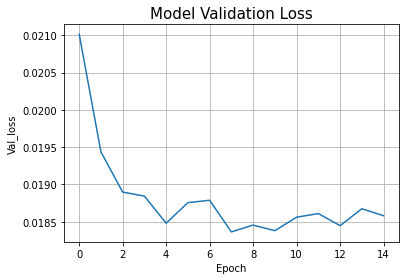

In [32]:
plt.title('Model Validation Loss', size='15')
plt.xlabel('Epoch')
plt.ylabel('Val_loss')
plt.grid(True)
plt.plot(history.history['val_loss'])
plt.savefig('./Result/LSTM/Graph/Model_Valdation_Loss.png')
plt.show

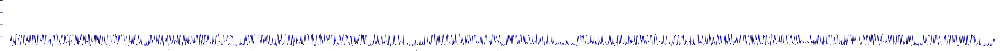

In [33]:
plt.figure(figsize=(300, 15))

plt.tick_params(axis='x', colors='blue', size=15)
plt.tick_params(axis='x', colors='blue', labelsize=12)
plt.tick_params(axis='y', colors='blue', size=15)
plt.tick_params(axis='y', colors='blue', labelsize=12)

plt.plot(pred, label = 'Prediction',color='blue')

plt.xticks([0, 31*24, 59*24, 90*24, 120*24, 151*24, 181*24, 212*24, 243*24, 273*24, 304*24, 334*24], 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W'])

plt.margins(x=0.005)
plt.savefig('./Result/LSTM/Graph/Prediction.png')
plt.show()

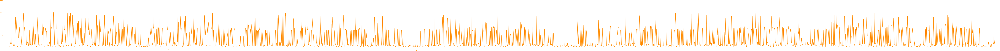

In [34]:
plt.figure(figsize=(300, 15))

plt.tick_params(axis='x', colors='darkorange', size=15)
plt.tick_params(axis='x', colors='darkorange', labelsize=12)
plt.tick_params(axis='y', colors='darkorange', size=15)
plt.tick_params(axis='y', colors='darkorange', labelsize=12)

plt.plot(y_test, label = 'Actual', color='darkorange')

plt.xticks([0, 31*24, 59*24, 90*24, 120*24, 151*24, 181*24, 212*24, 243*24, 273*24, 304*24, 334*24], 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W'])

plt.margins(x=0.005)
plt.savefig('./Result/LSTM/Graph/Actual.png')
plt.show()

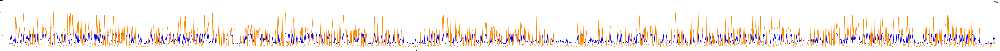

In [35]:
plt.figure(figsize=(300, 15))

plt.tick_params(axis='x', colors='black', size=15)
plt.tick_params(axis='x', colors='black', labelsize=12)
plt.tick_params(axis='y', colors='black', size=15)
plt.tick_params(axis='y', colors='black', labelsize=12)

plt.plot(pred, label = 'Prediction',color='blue')
plt.plot(y_test, label = 'Actual', color='darkorange')

plt.xticks([0, 31*24, 59*24, 90*24, 120*24, 151*24, 181*24, 212*24, 243*24, 273*24, 304*24, 334*24], 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W'])
plt.grid(True)
plt.legend()
plt.margins(x=0.005)
plt.savefig('./Result/LSTM/Graph/Pred_with_Actual.png')
plt.show()

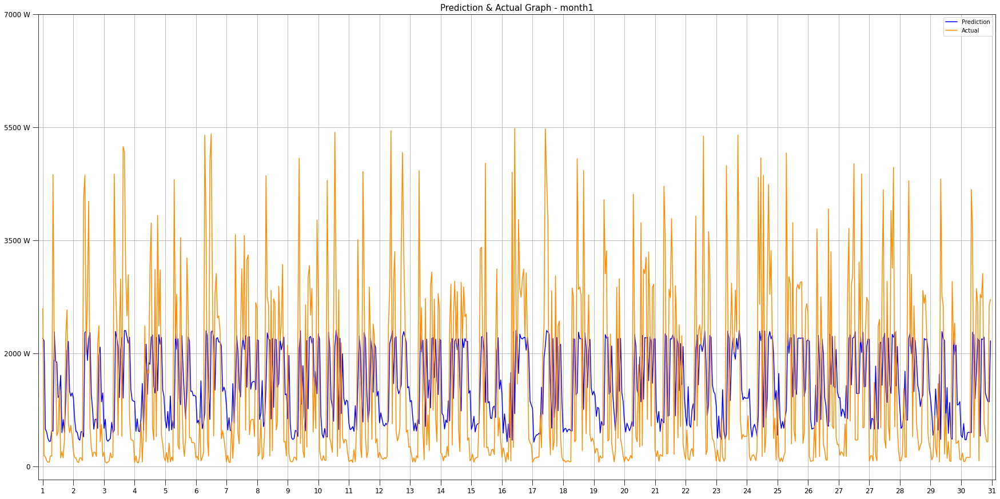

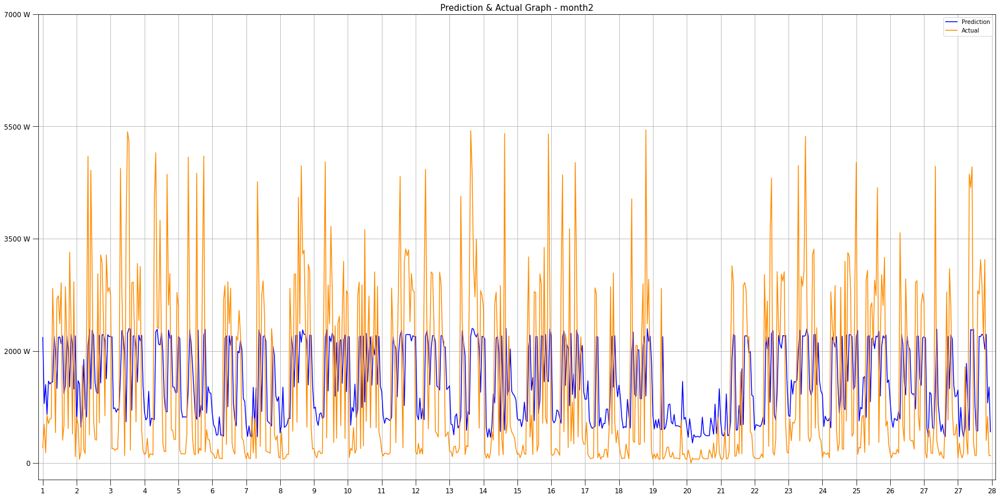

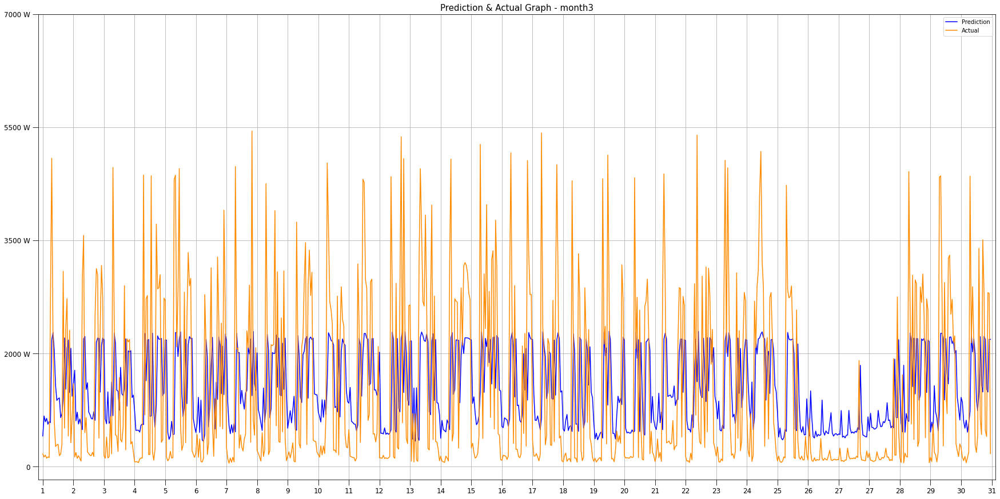

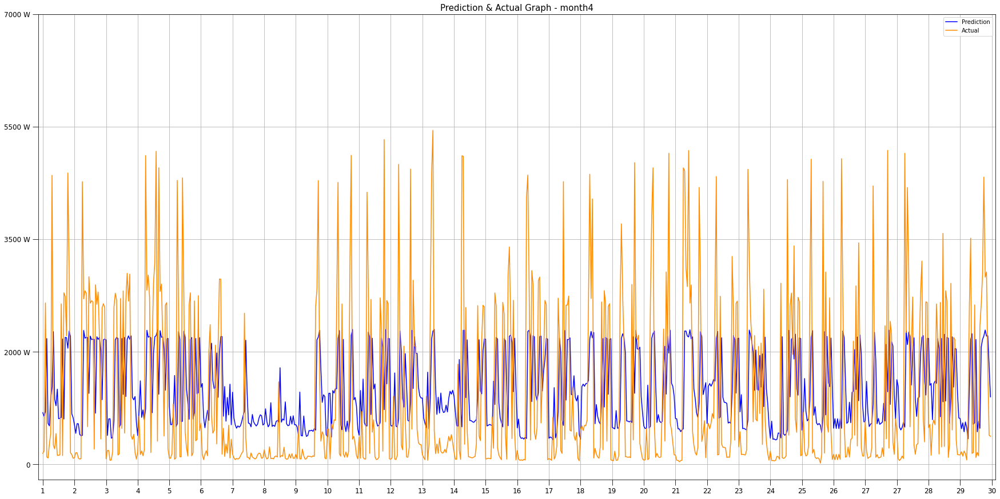

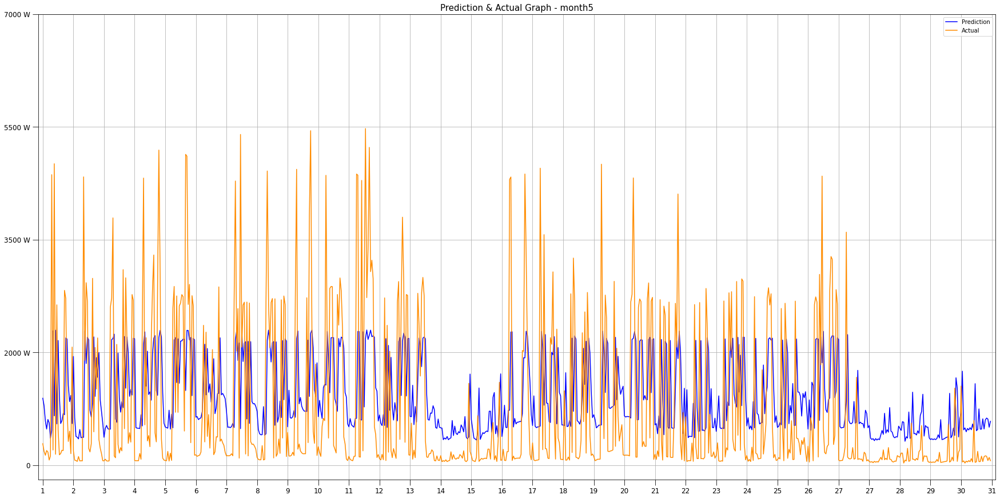

...

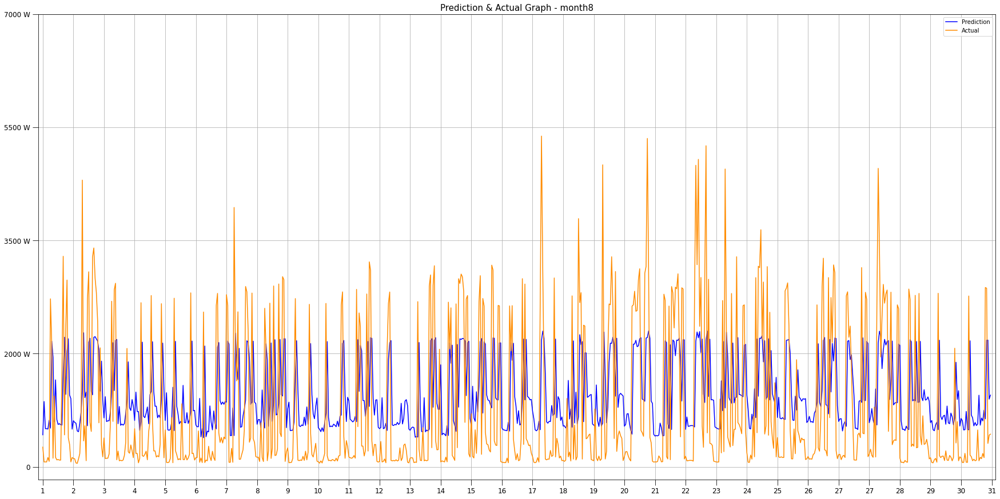

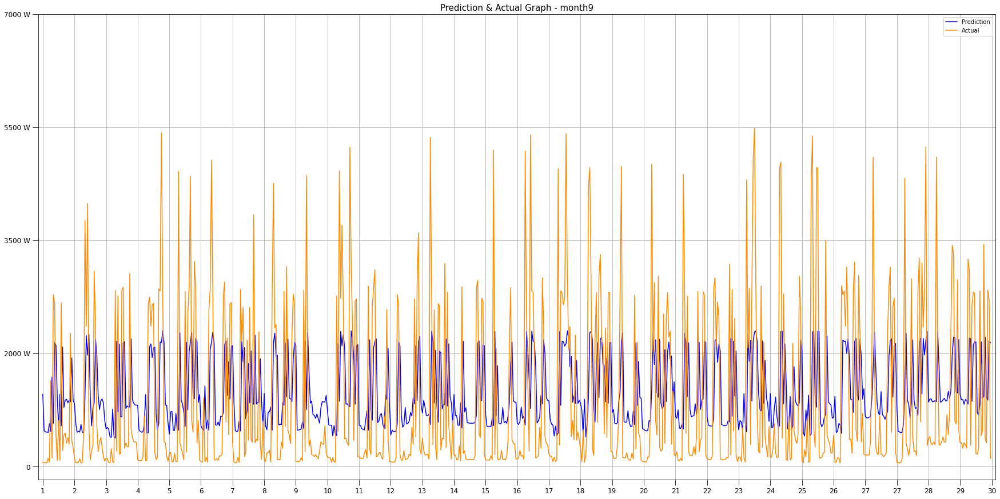

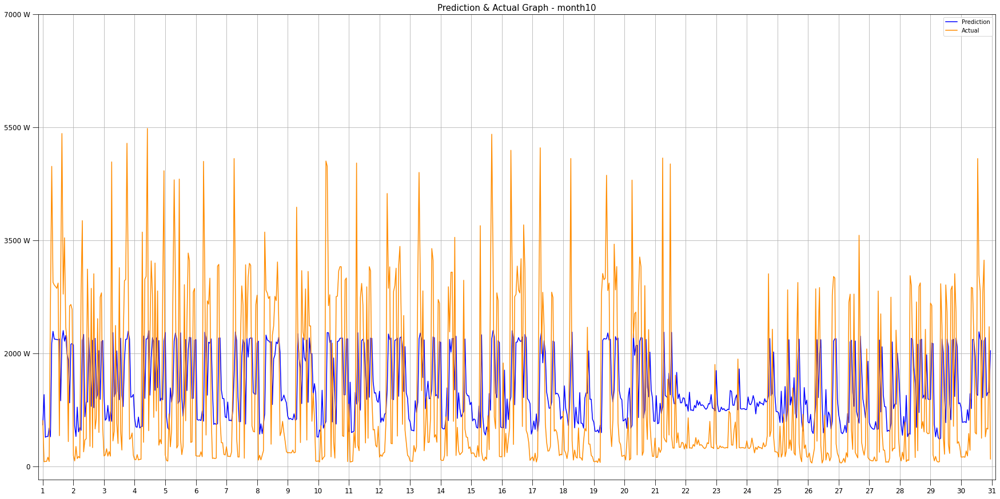

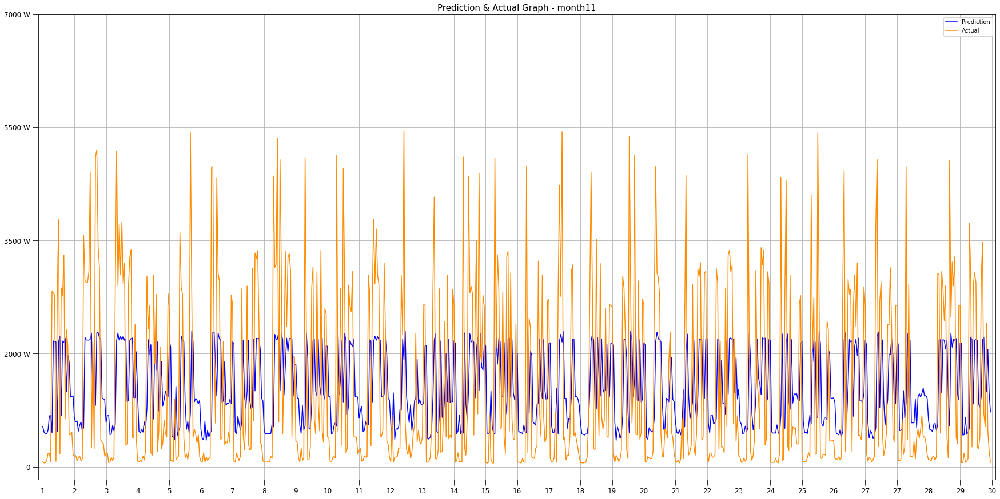

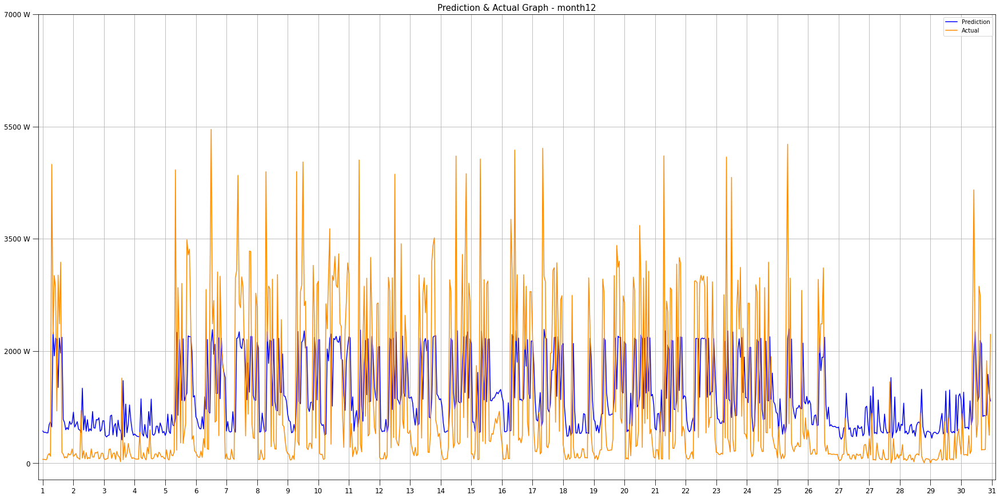

In [42]:
# 월 단위 그래프 분할 표시 및 저장
for m in range(1,13):
    month = {0:0, 1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    start = {1:0, 2:744, 3:1416, 4:2160, 5:2880, 6:3624, 7:4344, 8:5088, 9:5832, 10:6552, 11:7296, 12:8016}
    end = {1:744, 2:1416, 3:2160, 4:2880, 5:3624, 6:4344, 7:5088, 8:5832, 9:6552, 10:7296, 11:8016, 12:8760}
    
    plt.figure(figsize=(30, 15))
    
    plt.title('Prediction & Actual Graph - month'+str(m), size='15')
    
    plt.tick_params(axis='x', colors='black', size=10)
    plt.tick_params(axis='x', colors='black', labelsize=12)
    plt.tick_params(axis='y', colors='black', size=10)
    plt.tick_params(axis='y', colors='black', labelsize=12)
    
    plt.plot(pred[start[m]:end[m]], label = 'Prediction',color='blue', marker='.')
    plt.plot(y_test[start[m]:end[m]], label = 'Actual', color='darkorange', marker='.')
    
    xticks_list_28=[0, 24, 48, 72, 96, 120, 144, 168, 192, 216, 240, 264, 288, 312, 336, 360, 384, 408, 432, 456, 480, 504, 528, 552, 576, 600, 624, 648, 672]
    xticks_list_30=[0, 24, 48, 72, 96, 120, 144, 168, 192, 216, 240, 264, 288, 312, 336, 360, 384, 408, 432, 456, 480, 504, 528, 552, 576, 600, 624, 648, 672, 696, 720]
    xticks_list_31=[0, 24, 48, 72, 96, 120, 144, 168, 192, 216, 240, 264, 288, 312, 336, 360, 384, 408, 432, 456, 480, 504, 528, 552, 576, 600, 624, 648, 672, 696, 720, 744]
    
    if (m==1 or m==3 or m==5 or m==7 or m==8 or m==10 or m==12):
        plt.xticks(xticks_list_31, labels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', 
                                           '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '27', '28', '29', '30', '31'])
    if (m==4 or m==6  or m==9 or m==11):
        plt.xticks(xticks_list_30, labels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', 
                                           '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '27', '28', '29', '30'])
    if (m==2):
        plt.xticks(xticks_list_28, labels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', 
                                           '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '27', '28'])
        
    plt.yticks([0, 0.2, 0.4, 0.6, 0.8], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W'])
    
    plt.grid(True)
    plt.legend()
    plt.margins(x=0.005)
    plt.savefig('./Result/LSTM/Graph/Prediction_with_Actual_'+str(m)+'.png') # 이름 각각!

#### 그래프 비교 결과

In [43]:
import cv2
from skimage.metrics import structural_similarity as ssim

In [44]:
# 유사도 측정을 위한 이미지 가공
image1 = cv2.imread('./Result/LSTM/Graph/Prediction.png')
image2 = cv2.imread('./Result/LSTM/Graph/Actual.png')

tempDiff1 = cv2.subtract(image1, image2)

gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

In [45]:
# 차이 추출을 위한 뺄셈 과정
pred_list=pred.tolist()
actual_list=y_test.tolist()

result_numbers=[]
for minus in range(len(pred_list)):
    result = abs(float(pred_list[minus][0]) - float(actual_list[minus][0]))
    result_numbers.append(result)

In [46]:
(score, diff) = ssim(gray1, gray2, full=True)
sim_score = round(score,5)*100
result_num_total = round(sum(result_numbers),3)
final_score = (len(result_numbers) - result_num_total)/len(result_numbers)*100

print('그래프 유사도 ==>> %.3f %%\n' %sim_score)
print('예측차 판별도 ==>> %.3f %%' %final_score)

그래프 유사도 ==>> 81.077 %

예측차 판별도 ==>> 89.035 %


#### 성능 측정 지표

In [47]:
from sklearn.metrics import r2_score as r2
from sklearn.metrics import mean_absolute_error as MAE
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import mean_squared_log_error as MSLE

print('r2 >> %.4f' %r2(y_test, pred)) # 1에 가까워야 좋음
print('MAE >> %.4f' %MAE(y_test, pred)) # 0에 가까워야 좋음
print('MSE >> %.4f' %MSE(y_test, pred)) # 0에 가까워야 좋음
print('RMSE >> %.4f' %np.sqrt(MSE(y_test, pred))) # 0에 가까워야 좋음
print('RMSLE >> %.4f' %np.sqrt(MSLE(y_test, pred))) # 0에 가까워야 좋음

r2 >> 0.1329
MAE >> 0.1096
MSE >> 0.0190
RMSE >> 0.1377
RMSLE >> 0.1150


### 10. 예측값과 실제값 결과 csv 파일 저장

#### 1년 단위 데이터 저장

In [59]:
# 날짜 정보 생성
month = {1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
datetime_list=[]

for m in range(1, 13):
    month = {1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    for d in range(month[m]):
        d=d+1
        m=int(m)
        d=int(d)
        
        if m<=9:
            m='0'+str(m)
        if d<=9:
            d='0'+str(d)
            
        for h in range(1,25):
            elem = '2016'+'년-'+str(m)+'월-'+str(d)+'일-'+str(h)+'시'
            datetime_list.append(elem)

In [60]:
# 넘파이 어레이를 데이터 프레임으로 변환
pred_df = pd.DataFrame(pred)
actual_df = pd.DataFrame(y_test)

In [61]:
df_for_chart = pd.DataFrame(columns=['datetime', 'pred', 'actual'])
df_for_chart['datetime']=datetime_list
df_for_chart['pred']=pred_df
df_for_chart['actual']=actual_df
df_for_chart.to_csv("./Result/LSTM/Data/Electric_Prediction_result_data_for_Chart_Year.csv", encoding='cp949')

print('Job Done!!')

Job Done!!


#### 1달 단위 데이터 저장

In [62]:
pred_list=pred_df[0].values.tolist()
actual_list=actual_df[0].values.tolist()

for m in range(1,13):
    month = {0:0, 1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    start = {1:0, 2:744, 3:1416, 4:2160, 5:2880, 6:3624, 7:4344, 8:5088, 9:5832, 10:6552, 11:7296, 12:8016}
    end = {1:744, 2:1416, 3:2160, 4:2880, 5:3624, 6:4344, 7:5088, 8:5832, 9:6552, 10:7296, 11:8016, 12:8760}
    
    df_for_chart = pd.DataFrame(columns=['datetime', 'pred', 'actual'])
    df_for_chart['datetime']=datetime_list[start[m]:end[m]]
    df_for_chart['pred']=pred_list[start[m]:end[m]]
    df_for_chart['actual']=actual_list[start[m]:end[m]]
    
    df_for_chart.to_csv("./Result/LSTM/Data/Electric_Prediction_result_data_for_Chart_"+str(m)+".csv", encoding='cp949')
    
print('Job Done!!')

Job Done!!


#### 일주일 단위 데이터 저장

In [63]:
try:
    os.mkdir('./Result/LSTM/Data/Week')
    print('폴더 생성 완료.')
    
except FileExistsError:
    print('해당 폴더가 이미 존재합니다.')

해당 폴더가 이미 존재합니다.


In [64]:
pred_list=pred_df[0].values.tolist()
actual_list=actual_df[0].values.tolist()

count=0
for w in range(0, 8760-168, 168):
    count+=1
    start=w
    end=w+168
    
    df_for_chart = pd.DataFrame(columns=['datetime', 'pred', 'actual'])
    df_for_chart['datetime']=datetime_list[start:end]
    df_for_chart['pred']=pred_list[start:end]
    df_for_chart['actual']=actual_list[start:end]
    
    df_for_chart.to_csv("./Result/LSTM/Data//Week/Electric_Prediction_result_data_for_Chart_week"+str(count)+".csv", encoding='cp949')
    
print('Job Done!!')

Job Done!!
